In [2]:
import numpy as np  
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt 
import seaborn as sns
from os.path import join

import warnings 
warnings.filterwarnings('ignore')

In [3]:
cmap = mpl.cm.get_cmap('tab20')
# 设置正常显示中文标签
plt.rcParams['font.sans-serif'] = ['SimHei']
# 正常显示负号
plt.rcParams['axes.unicode_minus'] = False

结合我国当前的人口数量、人口结构以及人口政策，建立数学模型预测我国中小学学生数量的变化情况；

In [4]:
data_root = r'/home/drew/Desktop/MathModeling/SchoolCompetition/data'
cur_data = '全国数据'

In [5]:
# 人口出生率，死亡率和自然增长率
br_dr_ngr_df = pd.read_csv(join(data_root, cur_data, '人口出生率，死亡率和自然增长率.csv'), 
                           header=2, index_col=0).iloc[:-2, :].T
# 人口年龄结果和抚养比
pao_dr_df = pd.read_csv(join(data_root, cur_data, '人口年龄结果和抚养比.csv'), 
                        header=2, index_col=0).iloc[:-3, :].T
# 总人口
tp_df = pd.read_csv(join(data_root, cur_data, '总人口.csv'), 
                    header=2, index_col=0).iloc[:-2, :].T
# 按年龄分人口数
pbya_df = pd.read_csv(join(data_root, cur_data, '全国按年龄分人口数.csv'), 
                      header=2, index_col=0).iloc[:-2, :].T

人口结构

In [6]:
pbya_df.columns

Index(['人口数(人口抽样调查)(人)', '0-4岁人口数(人口抽样调查)(人)', '5-9岁人口数(人口抽样调查)(人)',
       '10-14岁人口数(人口抽样调查)(人)', '15-19岁人口数(人口抽样调查)(人)', '20-24岁人口数(人口抽样调查)(人)',
       '25-29岁人口数(人口抽样调查)(人)', '30-34岁人口数(人口抽样调查)(人)', '35-39岁人口数(人口抽样调查)(人)',
       '40-44岁人口数(人口抽样调查)(人)', '45-49岁人口数(人口抽样调查)(人)', '50-54岁人口数(人口抽样调查)(人)',
       '55-59岁人口数(人口抽样调查)(人)', '60-64岁人口数(人口抽样调查)(人)', '65-69岁人口数(人口抽样调查)(人)',
       '70-74岁人口数(人口抽样调查)(人)', '75-79岁人口数(人口抽样调查)(人)', '80-84岁人口数(人口抽样调查)(人)',
       '85-89岁人口数(人口抽样调查)(人)', '90-94岁人口数(人口抽样调查)(人)', '95岁以上人口数(人口抽样调查)(人)'],
      dtype='object', name='指标')

In [7]:
print(pbya_df.index)

Index(['2023年', '2022年', '2021年', '2020年', '2019年', '2018年', '2017年', '2016年',
       '2015年', '2014年', '2013年', '2012年', '2011年', '2010年', '2009年', '2008年',
       '2007年', '2006年', '2005年', '2004年'],
      dtype='object')


In [8]:
pbya_df.head()

指标,人口数(人口抽样调查)(人),0-4岁人口数(人口抽样调查)(人),5-9岁人口数(人口抽样调查)(人),10-14岁人口数(人口抽样调查)(人),15-19岁人口数(人口抽样调查)(人),20-24岁人口数(人口抽样调查)(人),25-29岁人口数(人口抽样调查)(人),30-34岁人口数(人口抽样调查)(人),35-39岁人口数(人口抽样调查)(人),40-44岁人口数(人口抽样调查)(人),...,50-54岁人口数(人口抽样调查)(人),55-59岁人口数(人口抽样调查)(人),60-64岁人口数(人口抽样调查)(人),65-69岁人口数(人口抽样调查)(人),70-74岁人口数(人口抽样调查)(人),75-79岁人口数(人口抽样调查)(人),80-84岁人口数(人口抽样调查)(人),85-89岁人口数(人口抽样调查)(人),90-94岁人口数(人口抽样调查)(人),95岁以上人口数(人口抽样调查)(人)
2023年,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022年,1443996.0,62248.0,90793.0,91846.0,79560.0,73629.0,85040.0,116755.0,109832.0,98379.0,...,127635.0,117482.0,71964.0,79964.0,58782.0,35928.0,22434.0,12542.0,4297.0,929.0
2021年,1494054.0,72978.0,96094.0,92304.0,79414.0,77256.0,91729.0,128056.0,109171.0,98023.0,...,129319.0,121989.0,70755.0,81345.0,56208.0,34886.0,22543.0,12317.0,4249.0,871.0
2020年,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019年,1091876.0,62722.0,60701.0,59844.0,55822.0,61519.0,81741.0,93971.0,77703.0,77044.0,...,93125.0,74068.0,60712.0,55086.0,35665.0,22610.0,14322.0,7036.0,2113.0,450.0


In [9]:
pbya_df.isna().any(axis=1)

2023年     True
2022年    False
2021年    False
2020年     True
2019年    False
2018年    False
2017年    False
2016年    False
2015年    False
2014年    False
2013年    False
2012年    False
2011年    False
2010年     True
2009年    False
2008年    False
2007年    False
2006年    False
2005年    False
2004年    False
dtype: bool

In [10]:
modify_col = ['人口数'] + [col.split('岁')[0] for col in pbya_df.columns][1:]
pbya_df.columns = modify_col

In [11]:
pbya_df.index = [idx.split('年')[0] for idx in pbya_df.index]

In [12]:
pbya_df

,人口数,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,...,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95
2023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022,1443996.0,62248.0,90793.0,91846.0,79560.0,73629.0,85040.0,116755.0,109832.0,98379.0,...,127635.0,117482.0,71964.0,79964.0,58782.0,35928.0,22434.0,12542.0,4297.0,929.0
2021,1494054.0,72978.0,96094.0,92304.0,79414.0,77256.0,91729.0,128056.0,109171.0,98023.0,...,129319.0,121989.0,70755.0,81345.0,56208.0,34886.0,22543.0,12317.0,4249.0,871.0
2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019,1091876.0,62722.0,60701.0,59844.0,55822.0,61519.0,81741.0,93971.0,77703.0,77044.0,...,93125.0,74068.0,60712.0,55086.0,35665.0,22610.0,14322.0,7036.0,2113.0,450.0
2018,1144648.0,67393.0,63322.0,62248.0,58258.0,68050.0,92977.0,93201.0,81886.0,83574.0,...,96850.0,69844.0,68014.0,54799.0,34810.0,22799.0,14845.0,6902.0,2031.0,458.0
2017,1145246.0,68313.0,63314.0,60727.0,59251.0,73185.0,100701.0,88959.0,82553.0,87713.0,...,96760.0,59823.0,68044.0,51552.0,32590.0,22553.0,14708.0,6606.0,1964.0,455.0
2016,1158019.0,68447.0,63831.0,60420.0,61562.0,79102.0,106663.0,87573.0,80485.0,94730.0,...,97608.0,59638.0,67696.0,48454.0,31677.0,22449.0,14331.0,6416.0,1902.0,413.0
2015,21312241.0,1243566.0,1174724.0,1103520.0,1165548.0,1554837.0,1992252.0,1573049.0,1507593.0,1824946.0,...,1615839.0,1193350.0,1211435.0,850443.0,563097.0,411240.0,253260.0,111758.0,33773.0,6894.0
2014,1124402.0,63990.0,63132.0,58287.0,64719.0,90785.0,98845.0,82546.0,81792.0,101959.0,...,77909.0,66409.0,61608.0,41709.0,29133.0,21330.0,13289.0,5604.0,1757.0,347.0


In [13]:
tp_df.head()

指标,年末总人口(万人),男性人口(万人),女性人口(万人),城镇人口(万人),乡村人口(万人)
2023年,140967.0,72032.0,68935.0,93267.0,47700.0
2022年,141175.0,72206.0,68969.0,92071.0,49104.0
2021年,141260.0,72311.0,68949.0,91425.0,49835.0
2020年,141212.0,72357.0,68855.0,90220.0,50992.0
2019年,141008.0,72039.0,68969.0,88426.0,52582.0


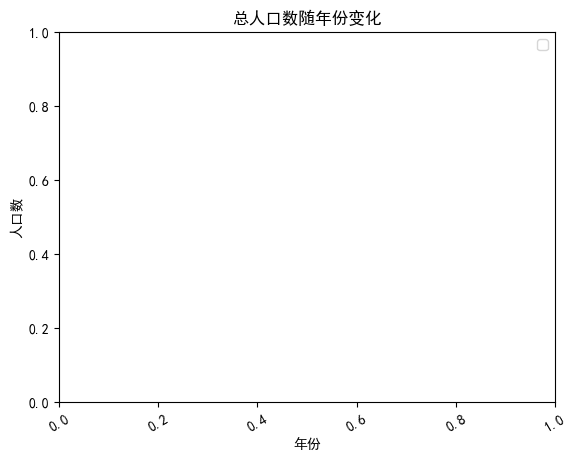

In [14]:
plt.xticks(rotation=30)
plt.title('总人口数随年份变化')
plt.xlabel('年份')
plt.ylabel('人口数')
plt.legend()

In [15]:
drop_columns = [
    # '2005', '2015', '2023', 
    '2020', '2010'
]

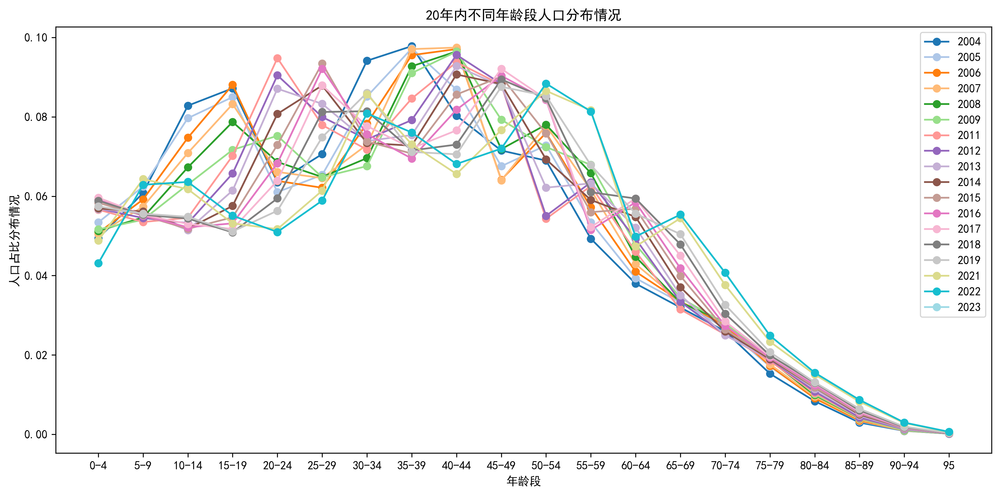

In [16]:
plt.figure(figsize=(12, 6), dpi=300)
other_age_groups = pbya_df.iloc[1:, 1:].drop(drop_columns).apply(lambda x: x/pbya_df.iloc[:, 0])
for i, (index, row) in enumerate(other_age_groups.iterrows()):
    if index in drop_columns:
        continue
    x = [index.split('岁')[0] for index in row.index]
    y = row.values.reshape(-1, 1)
    plt.plot(x, y, marker='o', label=index, color=cmap(i / len(x)))

plt.legend(loc='best')

plt.title('20年内不同年龄段人口分布情况')
plt.xlabel('年龄段')
plt.ylabel('人口占比分布情况')

plt.tight_layout()

plt.show()

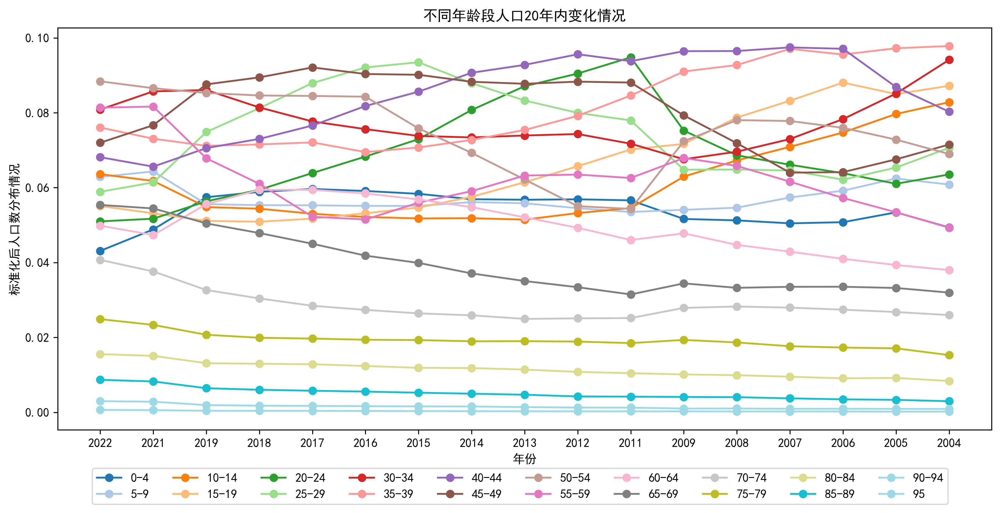

In [17]:
plt.figure(figsize=(12, 6), dpi=300)
for i, (index, row) in enumerate(other_age_groups.drop(
        drop_columns + ['2020', '2010'], axis=0).T.iterrows()):
    x = [index.split('岁')[0] for index in row.index][::-1]
    y = row.values.reshape(-1, 1)[::-1]
    plt.plot(x, y, marker='o', label=index, color=cmap(i / len(x)))

plt.legend(loc='lower right', bbox_to_anchor=(0.96, -0.2), ncol=10)

plt.title('不同年龄段人口20年内变化情况')
plt.xlabel('年份')
plt.ylabel('标准化后人口数分布情况')

plt.tight_layout()

plt.show()

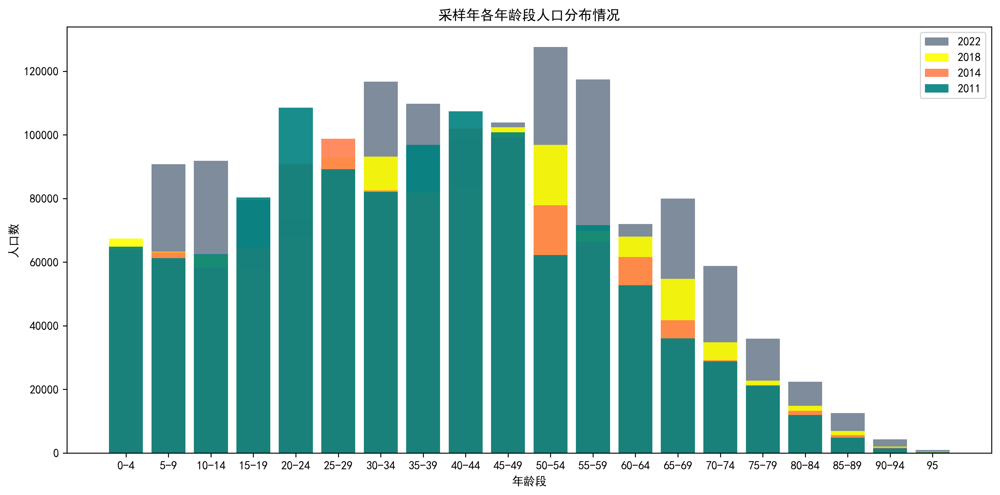

In [18]:
plt.figure(figsize=(12, 6), dpi=300)
for year, color in zip(['2022', '2018', '2014', '2011'], 
                       ['slategray', 'yellow', 'coral', 'teal']):
    age_data = pbya_df.loc[year, :].drop(['人口数'])
    plt.bar(x=age_data.index,height=age_data, color=color, alpha=0.9)

plt.legend(['2022', '2018', '2014', '2011'])
plt.title('采样年各年龄段人口分布情况')
plt.xlabel('年龄段')
plt.ylabel('人口数')

plt.tight_layout()

plt.show()

In [19]:
br_dr_ngr_df.head()

指标,人口出生率(‰),人口死亡率(‰),人口自然增长率(‰)
2023年,6.39,7.87,-1.48
2022年,6.77,7.37,-0.60
2021年,7.52,7.18,0.34
2020年,8.52,7.07,1.45
2019年,10.41,7.09,3.32


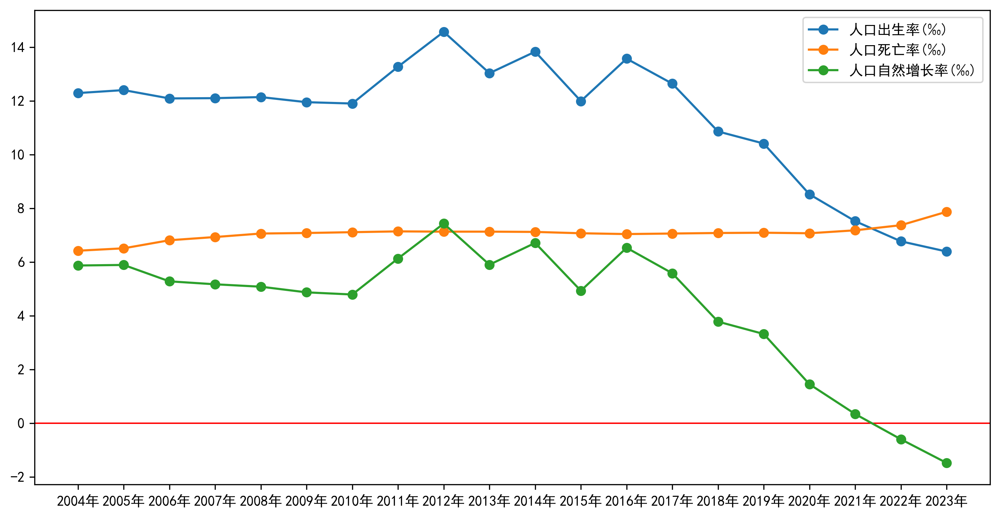

In [20]:
plt.figure(figsize=(12, 6), dpi=300)
plt.axhline(y=0, color='red', linewidth=1)
for index, row in br_dr_ngr_df.T.iterrows():
    if index in drop_columns:
        continue
    x = row.index[::-1]
    y = row[::-1]
    plt.plot(x, y, marker='o', label=index)
plt.legend()
plt.show()

In [21]:
pbya_df.head()

,人口数,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,...,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95
2023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022,1443996.0,62248.0,90793.0,91846.0,79560.0,73629.0,85040.0,116755.0,109832.0,98379.0,...,127635.0,117482.0,71964.0,79964.0,58782.0,35928.0,22434.0,12542.0,4297.0,929.0
2021,1494054.0,72978.0,96094.0,92304.0,79414.0,77256.0,91729.0,128056.0,109171.0,98023.0,...,129319.0,121989.0,70755.0,81345.0,56208.0,34886.0,22543.0,12317.0,4249.0,871.0
2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019,1091876.0,62722.0,60701.0,59844.0,55822.0,61519.0,81741.0,93971.0,77703.0,77044.0,...,93125.0,74068.0,60712.0,55086.0,35665.0,22610.0,14322.0,7036.0,2113.0,450.0


首先去除却缺失值,将不同年龄的分布变为占比情况, 用以消除不同尺度数据的影响

In [22]:
from sklearn.preprocessing import StandardScaler

In [23]:
train_df = pbya_df.dropna(axis=0)
train_df_copy = train_df.iloc[:, 1:].copy()
std = StandardScaler()
train_df.iloc[:, 1:] = std.fit_transform(train_df.iloc[:, 1:].apply(lambda x: x/train_df.iloc[:, 0]))
train_df.drop(['人口数'], axis=1, inplace=True)
train_df.head()

,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95
2022,-2.431481,1.719628,0.233921,-0.789509,-1.445820,-1.414361,0.455979,-0.518373,-1.589753,-0.870343,1.302590,2.158489,0.037447,2.007185,2.792338,2.590620,2.051938,2.316968,2.419165,2.534344
2021,-1.160806,2.155358,0.053903,-0.932876,-1.388486,-1.191501,1.176107,-0.797329,-1.824214,-0.393738,1.123151,2.191024,-0.324626,1.889312,2.070531,1.881342,1.827774,2.035984,2.201281,2.051873
2019,0.743527,-0.481954,-0.634033,-1.082496,-1.019119,0.007113,1.228523,-0.975070,-1.363617,0.718029,0.999232,0.644969,0.879715,1.383540,0.911343,0.657220,0.840320,0.890654,0.699349,0.686652
2018,1.060751,-0.564555,-0.676127,-1.099376,-0.771351,0.573601,0.540200,-0.940236,-1.135595,0.908718,0.932927,-0.118053,1.437036,1.057332,0.384529,0.291446,0.766285,0.627138,0.433490,0.590665
2017,1.231854,-0.575398,-0.809965,-1.037383,-0.416397,1.170109,-0.015517,-0.889398,-0.803014,1.179140,0.920918,-1.100915,1.436330,0.695231,-0.072473,0.187120,0.702981,0.460684,0.335268,0.568063


In [24]:
from statsmodels.tsa.stattools import adfuller

- 正如前面所述，差分的目的是使时间序列平稳。但我们应该注意不要过度差分这个序列。
- 过度差分的序列可能仍然是平稳的，这反过来会影响模型参数。
- 所以我们需要确定正确的差分阶数。正确的差分阶数是使序列接近平稳所需的最小差分，该序列围绕一个确定的均值波动，并且自相关图（ACF图）很快达到零。
  
- 如果自相关在许多滞后期（10个或更多）为正，则序列需要进一步差分。另一方面，如果第一滞后自相关本身过于负，则序列可能过度差分了。
- 如果我们在两个差分阶数之间无法做出决定，那么我们就选择使差分序列的标准差最小的阶数。
  
现在，我们将通过以下示例来解释这些概念：
- 首先，我将使用来自statsmodels包的增广迪基-富勒检验（ADF检验）来检查序列是否平稳。原因是只有在序列非平稳时才需要差分。否则，不需要差分，即d=0。
- ADF检验的零假设（Ho）是时间序列是非平稳的。因此，如果检验的p值小于显著性水平（0.05），我们就拒绝零假设，并推断时间序列确实是平稳的。

所以，在我们的情况下，如果P值 > 0.05，我们就继续寻找差分的阶数。


In [25]:
ADF_P_VALs = {}
for col in train_df.columns:
    result = adfuller(train_df.loc[:, col].values)
    ADF_P_VALs[col] = result
adf_p_vals = pd.DataFrame(ADF_P_VALs, [
    'ADF Statistic', 'p-value', 'Lags Used', 
    'Number of Observations Used', 
    'Critical Values (1%)(5%)(10%)', 
    'icbest'
])
adf_p_vals.to_csv('adf_p_vals.csv')

### 表格参数解释

这个数据表显示了多个年龄段的人口统计数据通过增广迪基-富勒（ADF）检验的结果。ADF检验是用来判断一个时间序列是否具有单位根，也就是说，它是否是非平稳的。如果时间序列是非平稳的，那么它可能需要差分以使其变得平稳，这在时间序列分析中是一个重要的步骤，特别是在应用如ARIMA模型之前。

以下是对数据表的分析：

1. **ADF Statistic（ADF 统计量）**：这一列显示了ADF检验的统计量。一般来说，ADF统计量越小，拒绝非平稳性的证据越强。对于大多数情况，如果ADF统计量小于临界值，我们可以认为序列是平稳的。

2. **p-value（p 值）**：p 值是用来判断统计检验结果是否显著的。如果p值小于显著性水平（通常是0.05），我们可以拒绝零假设，认为序列是平稳的。在你提供的数据中，有些年龄段的p值远大于0.05，这意味着我们没有足够的证据拒绝序列是非平稳的零假设。

3. **Lags Used（使用的滞后期）**：这一列显示了在进行ADF检验时使用的滞后阶数。滞后阶数的选择可以基于模型选择准则，如赤池信息准则（AIC）或贝叶斯信息准则（BIC）。

4. **Number of Observations Used（使用的观测值数量）**：这一列显示了在ADF检验中实际使用的观测值数量。由于差分操作会减少观测值的数量，所以这个数字通常小于原始序列的长度。

5. **Critical Values (1%)(5%)(10%)（临界值）**：这些是ADF检验的临界值，对应于不同的显著性水平。如果ADF统计量小于临界值，我们可以认为序列是平稳的。

6. **icbest**：这是选择最佳滞后阶数时使用的信息准则值。较小的icbest值通常表示更好的模型拟合。

根据提供的数据，我们可以得出以下结论：

- 对于年龄段 "25-29"，ADF统计量为 -4.024254，p 值为 0.001289，远小于0.05，因此我们可以认为该年龄段的序列是平稳的。
- 年龄段 "0-4"、"5-9"、"10-14"、"15-19"、"30-34"、"35-39"、"40-44"、"45-49"、"50-54"、"55-59"、"60-64"、"65-69"、"70-74"、"75-79"、"80-84"、"85-89"、"90-94" 和 "95" 的p值都大于0.05，表明我们不能拒绝序列是非平稳的零假设。
- 对于这些非平稳的序列，我们可能需要进一步差分。例如，"0-4" 年龄段的序列ADF统计量为 -2.672894，p 值为 0.078847，我们可能需要考虑一阶或二阶差分。

最后，选择正确的差分阶数通常需要结合实际数据的自相关图（ACF）和偏自相关图（PACF）来决定，以及可能的模型诊断检查。


In [26]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

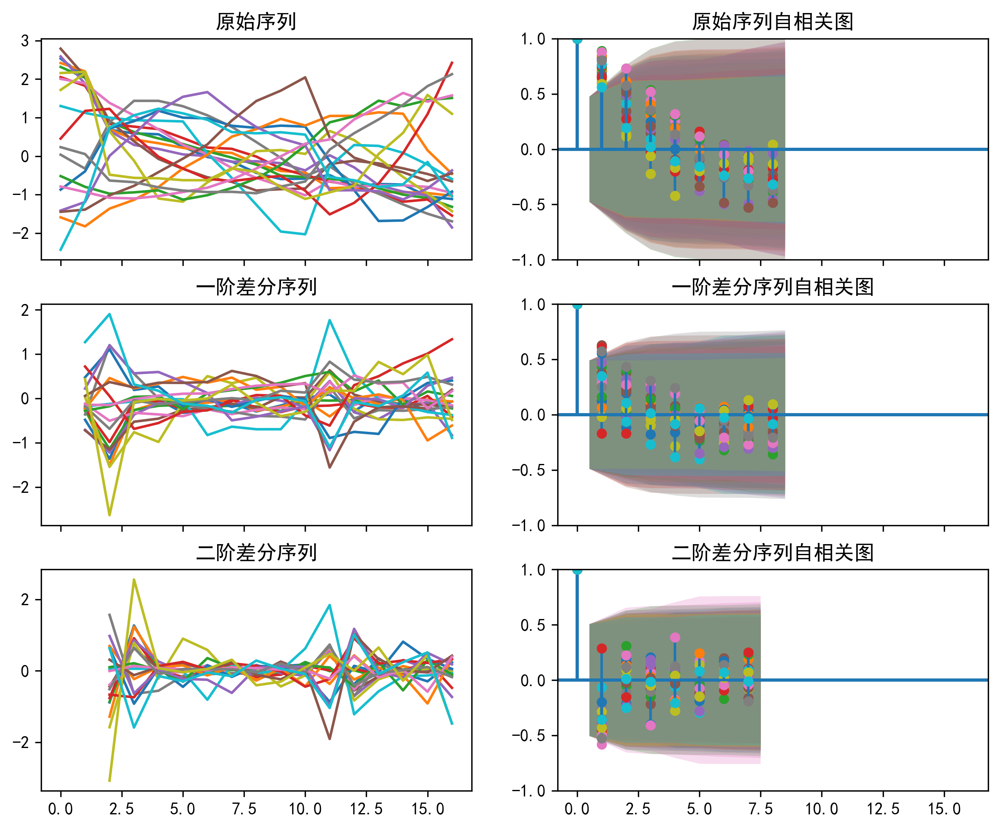

In [27]:
fig, axes = plt.subplots(3, 2, sharex=True, figsize=(10, 8), dpi=300)
for col in train_df.columns[::-1]:
    df = train_df.loc[:, col]
    axes[0, 0].plot(df.values); axes[0, 0].set_title('原始序列')
    plot_acf(df.values, ax=axes[0, 1], title='原始序列自相关图')

    # 1st Differencing
    axes[1, 0].plot(df.diff().values); axes[1, 0].set_title('一阶差分序列')
    plot_acf(df.diff().dropna().values, ax=axes[1, 1], title='一阶差分序列自相关图')

    # 2nd Differencing
    axes[2, 0].plot(df.diff().diff().values), axes[2, 0].set_title('二阶差分序列')
    plot_acf(df.diff().diff().dropna().values, ax=axes[2, 1], title='二阶差分序列自相关图')
plt.show()

根据你提供的图像内容，这似乎是三个时间序列及其自相关函数（ACF）图的文本表示。每个部分分别展示了原始序列、一阶差分后的序列和二阶差分后的序列的自相关性。下面是对这些图的分析：

1. **原始序列（Original Series）**:
   - 从自相关图可以看出，原始序列的自相关值在第一个滞后（即零延迟）是1.0，这符合所有时间序列自相关图的预期，因为任何序列与自身在零延迟时完全相关。
   - 随着滞后的增加，自相关值迅速下降，但仍然保持正值，这表明原始序列可能具有持久性（即自相关性衰减缓慢）。

2. **一阶差分后的序列（1st Order Differencing）**:
   - 一阶差分后的自相关图显示，在第一个滞后（即一阶差分后的零延迟）自相关值接近0.5，这表明差分后的序列仍然存在一定的自相关性。
   - 随着滞后的增加，自相关值进一步下降，但仍然保持正值。这可能表明序列在一阶差分后仍然需要进一步的处理。

3. **二阶差分后的序列（2nd Order Differencing）**:
   - 二阶差分后的自相关图显示，在第一个滞后自相关值接近0.5，与一阶差分后的情况相似。
   - 然而，值得注意的是，自相关图的模式似乎与一阶差分后的模式相似，这可能表明二阶差分并没有显著改变序列的自相关结构。

4. **时间序列图**:
   - 时间序列图显示了序列的波动情况。从图中可以看到，序列在一段时间内呈现出周期性的波动，这可能是季节性因素或其他周期性影响的结果。
   - 序列的值在一定的范围内上下波动，但没有显示出明显的趋势或季节性模式。

**结论**:
- 原始序列的自相关性衰减较慢，表明它可能是非平稳的。
- 一阶和二阶差分后的序列自相关性有所降低，但仍然存在。这可能表明序列可能需要更多的差分或考虑其他形式的转换来实现平稳性。
- 根据自相关图，我们不能直接得出序列是否已经平稳，可能需要进一步的分析，如偏自相关图（PACF）或再次进行ADF检验。

请注意，这些结论是基于文本描述的简化分析，实际分析时需要查看图形并结合其他统计检验。如果你能提供实际的图形文件，我可以提供更具体的分析。


下一步是确定模型是否需要任何自回归（AR）项。我们将通过检查偏自相关（PACF）图来找出所需的AR项的数量。
偏自相关可以想象为系列与其滞后之间的相关性，在排除了中间滞后的贡献之后。因此，PACF在某种程度上传达了滞后和系列之间的纯相关性。这样，我们就可以知道是否需要将该滞后包含在AR项中。
系列的滞后（k）的偏自相关是Y的自回归方程中该滞后的系数。
Yt = α0 + α1Yt−1 + α2Yt−2 + α3Yt−3

也就是说，假设Y_t是当前系列，Y_t-1是Y的滞后1，则滞后3（Y_t-3）的偏自相关是上述方程中Y_t-3的系数α3。

现在，我们应该找出AR项的数量。在平稳系列中的任何自相关都可以通过添加足够的AR项来纠正。因此，我们最初将AR项的阶数设置为PACF图中超过显著性极限的滞后数量。

这段描述解释了在时间序列分析中如何使用偏自相关图来确定自回归模型的阶数。通过观察PACF图中显著不为零的滞后值，可以帮助我们识别需要包含在自回归模型中的滞后项。如果滞后值在某个点之后迅速下降至零，则该点之前的所有滞后都可能是模型中需要的AR项。


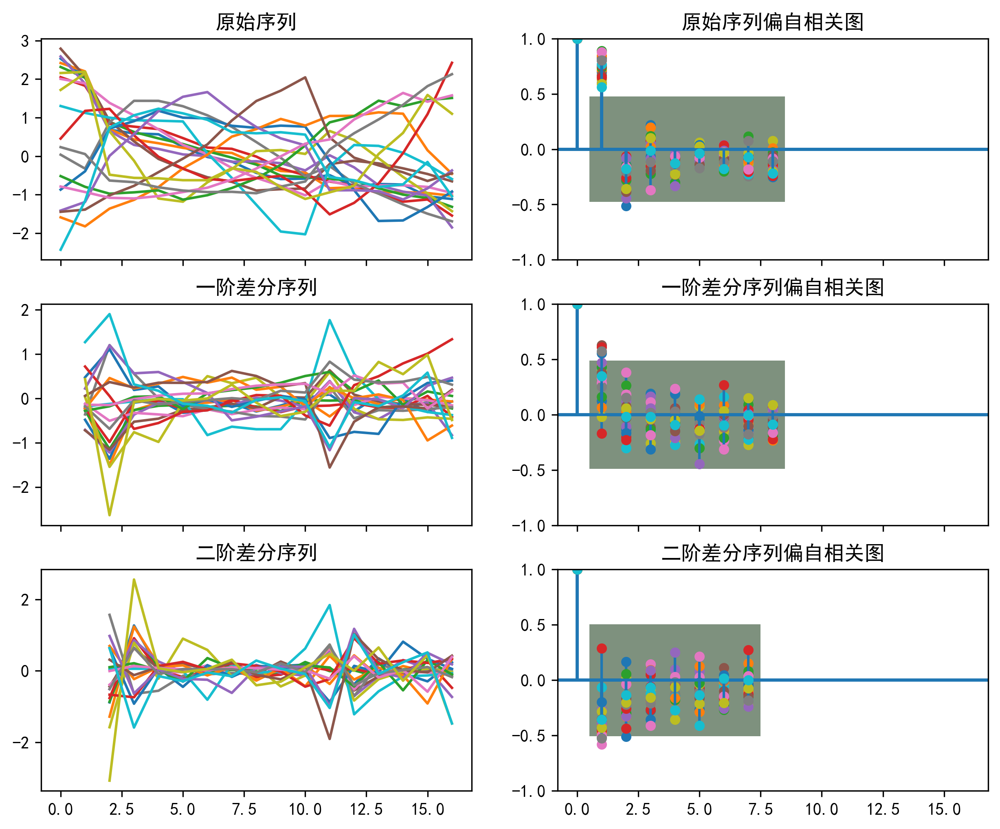

In [28]:
fig, axes = plt.subplots(3, 2, sharex=True, figsize=(10, 8), dpi=300)
for col in train_df.columns[::-1]:
    df = train_df.loc[:, col]
    axes[0, 0].plot(df.values); axes[0, 0].set_title('原始序列')
    plot_pacf(df.values, ax=axes[0, 1], title='原始序列偏自相关图')

    # 1st Differencing
    axes[1, 0].plot(df.diff().values); axes[1, 0].set_title('一阶差分序列')
    plot_pacf(df.diff().dropna().values, ax=axes[1, 1], title='一阶差分序列偏自相关图')

    # 2nd Differencing
    axes[2, 0].plot(df.diff().diff().values), axes[2, 0].set_title('二阶差分序列')
    plot_pacf(df.diff().diff().dropna().values, ax=axes[2, 1], title='二阶差分序列偏自相关图')
plt.show()

根据你提供的文件内容，这是三个时间序列的偏自相关函数（PACF）图的文本表示。偏自相关函数图用于识别时间序列模型的阶数，特别是自回归（AR）部分的阶数。下面是对这些图的分析：

1. **原始序列（Original Series）**:
   - 偏自相关图中，零延迟（即当lag=0时）的值是1.0，这是预期的，因为它代表了序列与其自身的相关性。
   - 随着滞后增加，偏自相关值开始下降，但仍然有一些滞后期的偏自相关值保持在显著水平（例如0.10和0.08），这可能表明原始序列具有一些短期的自相关性。

2. **一阶差分后的序列（1st Order Differencing）**:
   - 一阶差分后的偏自相关图显示，在第一个滞后（lag=1）偏自相关值显著下降，接近0.5，这表明一阶差分后的序列仍然存在一些自相关性。
   - 随着滞后的进一步增加，偏自相关值迅速下降并接近-0.01和-0.5，这可能表明序列在一阶差分后仍需要进一步处理。

3. **二阶差分后的序列（2nd Order Differencing）**:
   - 二阶差分后的偏自相关图显示，在第一个滞后偏自相关值略有下降，但仍然接近0.5，表明序列可能仍存在一些自相关性。
   - 然而，从文本中可以看出，随着滞后的增加，偏自相关值迅速下降并接近零或负值，这可能表明二阶差分后的序列自相关性已经大大减弱。

**结论**:
- 原始序列的偏自相关图表明序列可能需要差分以减少自相关性。
- 一阶差分后的序列仍然显示出一些自相关性，这可能表明需要进一步的差分。
- 二阶差分后的序列偏自相关图显示自相关性已经减弱，这可能表明序列已经接近平稳，或者至少自相关性已经降低到可以接受的水平。

请注意，选择正确的差分阶数应该基于综合考虑ACF和PACF图的结果，以及ADF检验的统计量和p值。此外，偏自相关图的截断（即在滞后大于某个值之后偏自相关迅速下降到零）通常表明可以考虑在这个滞后阶数的AR模型。然而，最终模型的选择还应考虑其他因素，如模型的AIC或BIC值，以及模型的诊断检验结果。


正如我们通过PACF图来确定AR项的数量一样，我们也会通过ACF图来确定MA项的数量。从技术上讲，MA项是滞后预测的误差。

ACF显示了为了在平稳系列中消除任何自相关性需要多少MA项。

让我们来看一下差分系列的自相关图。



In [29]:
adf_p_vals

,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95
ADF Statistic,-2.672894,-1.864283,1.219045,-2.274257,-2.111259,-4.024254,-2.073498,2.693326,-0.755279,-1.984819,-1.453041,-3.85423,0.032042,-2.869449,-1.81764,0.705939,-1.552511,-2.997396,-1.83459,-2.903657
p-value,0.078847,0.349046,0.996115,0.180405,0.240012,0.001289,0.255304,0.999087,0.831907,0.293269,0.556601,0.002399,0.961103,0.049018,0.37174,0.989956,0.507394,0.035138,0.363429,0.044924
Lags Used,0,6,0,6,6,4,1,6,6,1,6,1,0,0,2,2,6,0,6,2
Number of Observations Used,16,10,16,10,10,12,15,10,10,15,10,15,16,16,14,14,10,16,10,14
Critical Values (1%)(5%)(10%),"{'1%': -3.9240193847656246, '5%': -3.068498203...","{'1%': -4.331573, '5%': -3.23295, '10%': -2.7487}","{'1%': -3.9240193847656246, '5%': -3.068498203...","{'1%': -4.331573, '5%': -3.23295, '10%': -2.7487}","{'1%': -4.331573, '5%': -3.23295, '10%': -2.7487}","{'1%': -4.137829282407408, '5%': -3.1549724074...","{'1%': -3.9644434814814815, '5%': -3.084908148...","{'1%': -4.331573, '5%': -3.23295, '10%': -2.7487}","{'1%': -4.331573, '5%': -3.23295, '10%': -2.7487}","{'1%': -3.9644434814814815, '5%': -3.084908148...","{'1%': -4.331573, '5%': -3.23295, '10%': -2.7487}","{'1%': -3.9644434814814815, '5%': -3.084908148...","{'1%': -3.9240193847656246, '5%': -3.068498203...","{'1%': -3.9240193847656246, '5%': -3.068498203...","{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.331573, '5%': -3.23295, '10%': -2.7487}","{'1%': -3.9240193847656246, '5%': -3.068498203...","{'1%': -4.331573, '5%': -3.23295, '10%': -2.7487}","{'1%': -4.01203360058309, '5%': -3.10418387755..."
icbest,15.432698,10.051519,2.544873,-18.968903,20.438823,9.452532,12.568728,-12.598246,2.43018,10.323599,12.15866,11.010255,-1.13445,-8.680351,-1.058707,5.621578,-15.478503,-17.87959,-11.903506,-8.116436


In [30]:
diff_1_df = train_df[::-1].diff().dropna()
ADF_P_VALs_1 = {}
for col in diff_1_df.columns:
    result = adfuller(diff_1_df.loc[:, col].values)
    ADF_P_VALs_1[col] = result
adf_p_vals_1 = pd.DataFrame(ADF_P_VALs_1, [
    'ADF Statistic', 'p-value', 'Lags Used', 
    'Number of Observations Used', 
    'Critical Values (1%)(5%)(10%)', 
    'icbest'
])
adf_p_vals_1

,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95
ADF Statistic,-2.134742,3.306636,-0.378649,0.000279,-7.975201,-2.200588,-9.573743,-0.036616,-2.458769,1.241649,-1.8307,-2.389221,-2.736315,-17.953072,1.798218,-2.721495,-0.865888,1.183382,-3.399844,-3.118389
p-value,0.230776,1.0,0.913603,0.958555,0.0,0.206032,0.0,0.955397,0.125831,0.996261,0.36533,0.144802,0.067962,0.0,0.998345,0.070392,0.798998,0.995869,0.010964,0.025222
Lags Used,0,6,1,6,5,0,6,6,0,6,4,3,0,6,6,0,4,6,0,0
Number of Observations Used,15,9,14,9,10,15,9,9,15,9,11,12,15,9,9,15,11,9,15,15
Critical Values (1%)(5%)(10%),"{'1%': -3.9644434814814815, '5%': -3.084908148...","{'1%': -4.473135048010974, '5%': -3.2898806035...","{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.473135048010974, '5%': -3.2898806035...","{'1%': -4.331573, '5%': -3.23295, '10%': -2.7487}","{'1%': -3.9644434814814815, '5%': -3.084908148...","{'1%': -4.473135048010974, '5%': -3.2898806035...","{'1%': -4.473135048010974, '5%': -3.2898806035...","{'1%': -3.9644434814814815, '5%': -3.084908148...","{'1%': -4.473135048010974, '5%': -3.2898806035...","{'1%': -4.223238279489106, '5%': -3.1893689256...","{'1%': -4.137829282407408, '5%': -3.1549724074...","{'1%': -3.9644434814814815, '5%': -3.084908148...","{'1%': -4.473135048010974, '5%': -3.2898806035...","{'1%': -4.473135048010974, '5%': -3.2898806035...","{'1%': -3.9644434814814815, '5%': -3.084908148...","{'1%': -4.223238279489106, '5%': -3.1893689256...","{'1%': -4.473135048010974, '5%': -3.2898806035...","{'1%': -3.9644434814814815, '5%': -3.084908148...","{'1%': -3.9644434814814815, '5%': -3.084908148..."
icbest,18.558152,-3.788649,0.343505,-27.248257,-11.776464,13.258393,-23.019283,-30.196523,1.014633,7.940401,-32.797067,20.483488,16.501112,-48.192515,-4.660482,9.066198,-0.694577,7.081004,14.263335,12.232609


In [31]:
diff_2_df = train_df[::-1].diff().diff().dropna()
ADF_P_VALs_2 = {}
for col in diff_2_df.columns:
    result = adfuller(diff_2_df.loc[:, col].values)
    ADF_P_VALs_2[col] = result
adf_p_vals_2 = pd.DataFrame(ADF_P_VALs_2, [
    'ADF Statistic', 'p-value', 'Lags Used', 
    'Number of Observations Used', 
    'Critical Values (1%)(5%)(10%)', 
    'icbest'
])
adf_p_vals_2

,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95
ADF Statistic,-5.83728,-4.692635,-6.628372,-1.725682,-1.741952,-5.116319,-1.849642,-14.128102,-5.518116,-4.049048,-2.52839,-4.204389,-4.225364,-7.089036,-5.089629,-5.139401,-4.306616,-5.900914,-6.344531,-2.645886
p-value,0.0,0.000087,0.0,0.417931,0.409637,0.000013,0.356109,0.0,0.000002,0.001174,0.108719,0.000648,0.000597,0.0,0.000015,0.000012,0.000433,0.0,0.0,0.083879
Lags Used,0,5,0,5,3,0,1,5,0,0,5,0,0,0,0,0,2,0,0,2
Number of Observations Used,14,9,14,9,11,14,13,9,14,14,9,14,14,14,14,14,12,14,14,12
Critical Values (1%)(5%)(10%),"{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.473135048010974, '5%': -3.2898806035...","{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.473135048010974, '5%': -3.2898806035...","{'1%': -4.223238279489106, '5%': -3.1893689256...","{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.068853732362312, '5%': -3.1271488757...","{'1%': -4.473135048010974, '5%': -3.2898806035...","{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.473135048010974, '5%': -3.2898806035...","{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.137829282407408, '5%': -3.1549724074...","{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.01203360058309, '5%': -3.10418387755...","{'1%': -4.137829282407408, '5%': -3.1549724074..."
icbest,18.09647,16.525755,1.334081,-29.248256,-4.770326,13.440915,8.187328,-32.184465,3.19872,10.023585,-10.234776,21.759611,19.426799,-4.782267,0.789026,8.907622,4.622912,8.462957,15.854406,11.179308


In [32]:
diff_2_df.head()

,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95
2006,-1.473999,-1.473948,-0.176641,0.389945,0.423674,0.180246,0.325328,-0.101863,0.336524,0.053837,-0.067654,-0.033578,0.041525,-0.115658,-0.044753,-0.730839,-0.475924,-0.136853,-0.043054,0.238726
2007,0.515283,0.437596,0.107925,-0.584303,-0.044461,0.503600,0.219995,0.299392,-0.914436,0.335193,-0.129242,0.058931,0.039221,-0.042787,-0.018285,0.064035,0.273248,0.074472,-0.030664,-0.295005
2008,0.241708,-0.276688,0.020905,0.025843,0.019684,-0.192010,0.289818,-0.546139,-0.125209,0.815363,-0.156190,-0.015949,-0.013269,-0.033118,-0.058406,0.302308,-0.011512,0.040026,0.133094,-0.071165
2009,-0.090349,0.652468,-0.066232,-0.186627,0.325392,-0.028760,0.201761,0.243530,0.086539,-0.045912,-0.573978,-0.235537,0.183998,0.184824,-0.155397,-0.152378,-0.100346,-0.168718,-0.152881,0.346975
2011,1.016831,-0.000102,-0.405714,0.408104,1.034887,1.174862,0.914377,-0.437931,-0.244637,0.139013,-1.216684,-0.831958,-0.709746,-0.523618,-0.550518,-0.706985,0.057780,0.013633,0.432671,-0.377824


无外部影响的时序预测

In [33]:
from statsmodels.tsa.vector_ar.var_model import VAR

In [34]:
model_10 = VAR(diff_1_df)
result_10 = model_10.fit(5, method='ols', trend='c')
res_10 = result_10.forecast(train_df[::-1].iloc[:5, :].values, 1)
res_10_df = pd.DataFrame(res_10, index=['2010'], columns=train_df.columns)

train_df = pd.concat([train_df[::-1], res_10_df]).sort_index()

/home/drew/miniconda3/envs/mathmodel/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [35]:
train_df

,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95
2004,-1.042874,1.100359,2.129099,1.577862,-0.446360,-0.370628,2.425327,1.511027,-0.459790,-0.919200,-0.596011,-1.429600,-1.693430,-0.955978,-0.654746,-1.852611,-1.544752,-1.316994,-1.028424,-1.114481
2005,-0.151342,1.589059,1.818964,1.414751,-0.645063,-0.838164,1.089225,1.455844,0.153112,-1.321874,-0.220353,-0.968032,-1.494903,-0.799163,-0.463521,-1.021767,-1.126090,-1.089949,-0.959266,-1.045304
2006,-0.733809,0.603811,1.332188,1.641585,-0.420092,-1.125454,0.078451,1.298798,1.102539,-1.670711,0.087650,-0.540042,-1.254851,-0.758007,-0.317049,-0.921762,-1.183352,-0.999758,-0.933161,-0.737401
2007,-0.800993,0.056158,0.953337,1.284117,-0.239583,-0.909144,-0.712329,1.441143,1.137529,-1.684355,0.266412,-0.053122,-0.975577,-0.759637,-0.188862,-0.757721,-0.967366,-0.835094,-0.937720,-0.724503
2008,-0.626469,-0.768181,0.595390,0.952491,-0.039390,-0.884844,-1.213290,1.037349,1.047310,-0.882636,0.288983,0.417849,-0.709572,-0.794386,-0.119081,-0.291373,-0.762891,-0.630404,-0.809185,-0.782770
2009,-0.542294,-0.940053,0.171211,0.434239,0.486194,-0.889304,-1.512491,0.877086,1.043630,-0.126828,-0.262424,0.653283,-0.259569,-0.644310,-0.204697,0.022598,-0.658763,-0.594432,-0.833532,-0.494063
2010,-0.411402,-0.394313,0.418207,0.708752,0.434675,-0.684261,-0.875930,0.927196,0.866887,-0.320982,-0.319778,0.045455,-0.695167,-0.752625,-0.352405,-0.266960,-0.724473,-0.659308,-0.749733,-0.547939
2011,0.558711,-1.112026,-0.658682,0.324091,2.046665,0.281099,-0.897314,0.278891,0.795313,0.767991,-2.030515,0.056759,-0.519312,-1.017853,-0.840831,-0.370417,-0.496855,-0.544828,-0.425207,-0.583179
2012,0.620587,-0.808430,-0.791584,-0.005897,1.700978,0.461420,-0.513264,-0.227199,0.966318,0.792330,-1.958488,0.158451,-0.043382,-0.773367,-0.858253,-0.182621,-0.319765,-0.505196,-0.384377,-0.595945
2013,0.593519,-0.409353,-0.963748,-0.321768,1.432086,0.755710,-0.572431,-0.579692,0.703084,0.734640,-1.262295,0.129572,0.366144,-0.564513,-0.892479,-0.132637,-0.011109,-0.219341,-0.196749,-0.434705


In [36]:
diff_1_df = train_df.diff().dropna()
diff_1_df

,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95
2005,0.891532,0.488700,-0.310135,-0.163111,-0.198703,-0.467536,-1.336102,-0.055183,0.612903,-0.402674,0.375658,0.461568,0.198527,0.156814,0.191225,0.830844,0.418662,0.227045,0.069159,0.069177
2006,-0.582467,-0.985248,-0.486776,0.226834,0.224970,-0.287290,-1.010774,-0.157046,0.949426,-0.348837,0.308004,0.427989,0.240053,0.041156,0.146472,0.100005,-0.057262,0.090192,0.026105,0.307903
2007,-0.067184,-0.547652,-0.378851,-0.357469,0.180509,0.216310,-0.790780,0.142345,0.034990,-0.013644,0.178761,0.486920,0.279274,-0.001630,0.128187,0.164040,0.215986,0.164664,-0.004559,0.012898
2008,0.174524,-0.824340,-0.357947,-0.331625,0.200193,0.024300,-0.500961,-0.403794,-0.090219,0.801719,0.022572,0.470971,0.266005,-0.034748,0.069781,0.466348,0.204474,0.204690,0.128535,-0.058267
2009,0.084175,-0.171871,-0.424179,-0.518252,0.525584,-0.004460,-0.299200,-0.160263,-0.003680,0.755807,-0.551407,0.235434,0.450003,0.150075,-0.085616,0.313970,0.104129,0.035972,-0.024346,0.288708
2010,0.130893,0.545739,0.246996,0.274512,-0.051519,0.205043,0.636561,0.050111,-0.176743,-0.194153,-0.057354,-0.607828,-0.435598,-0.108314,-0.147707,-0.289557,-0.065710,-0.064876,0.083799,-0.053876
2011,0.970113,-0.717713,-1.076889,-0.384661,1.611990,0.965360,-0.021384,-0.648305,-0.071574,1.088973,-1.710737,0.011304,0.175854,-0.265228,-0.488427,-0.103458,0.227619,0.114481,0.324526,-0.035241
2012,0.061876,0.303596,-0.132902,-0.329988,-0.345686,0.180321,0.384050,-0.506090,0.171005,0.024339,0.072027,0.101691,0.475930,0.244485,-0.017421,0.187796,0.177090,0.039632,0.040830,-0.012766
2013,-0.027068,0.399077,-0.172164,-0.315870,-0.268892,0.294289,-0.059166,-0.352494,-0.263234,-0.057690,0.696193,-0.028879,0.409526,0.208855,-0.034226,0.049984,0.308656,0.285854,0.187628,0.161240
2014,0.031743,0.094831,0.036661,-0.286186,-0.506264,0.412564,-0.075489,-0.248197,-0.195689,0.054053,0.696415,-0.466567,0.395032,0.257130,0.224414,-0.015008,0.201267,0.181052,0.280289,0.294069


In [37]:
model_20 = VAR(diff_1_df)
result_20 = model_20.fit(10, method='ols', trend='c')
res_20 = result_20.forecast(train_df[::-1].iloc[:16, :].values, 1)
res_20_df = pd.DataFrame(res_20, index=['2020'], columns=train_df.columns)

train_df = pd.concat([train_df[::-1], res_20_df]).sort_index()

/home/drew/miniconda3/envs/mathmodel/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [38]:
train_df

,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95
2004,-1.042874,1.100359,2.129099,1.577862,-0.446360,-0.370628,2.425327,1.511027,-0.459790,-0.919200,-0.596011,-1.429600,-1.693430,-0.955978,-0.654746,-1.852611,-1.544752,-1.316994,-1.028424,-1.114481
2005,-0.151342,1.589059,1.818964,1.414751,-0.645063,-0.838164,1.089225,1.455844,0.153112,-1.321874,-0.220353,-0.968032,-1.494903,-0.799163,-0.463521,-1.021767,-1.126090,-1.089949,-0.959266,-1.045304
2006,-0.733809,0.603811,1.332188,1.641585,-0.420092,-1.125454,0.078451,1.298798,1.102539,-1.670711,0.087650,-0.540042,-1.254851,-0.758007,-0.317049,-0.921762,-1.183352,-0.999758,-0.933161,-0.737401
2007,-0.800993,0.056158,0.953337,1.284117,-0.239583,-0.909144,-0.712329,1.441143,1.137529,-1.684355,0.266412,-0.053122,-0.975577,-0.759637,-0.188862,-0.757721,-0.967366,-0.835094,-0.937720,-0.724503
2008,-0.626469,-0.768181,0.595390,0.952491,-0.039390,-0.884844,-1.213290,1.037349,1.047310,-0.882636,0.288983,0.417849,-0.709572,-0.794386,-0.119081,-0.291373,-0.762891,-0.630404,-0.809185,-0.782770
2009,-0.542294,-0.940053,0.171211,0.434239,0.486194,-0.889304,-1.512491,0.877086,1.043630,-0.126828,-0.262424,0.653283,-0.259569,-0.644310,-0.204697,0.022598,-0.658763,-0.594432,-0.833532,-0.494063
2010,-0.411402,-0.394313,0.418207,0.708752,0.434675,-0.684261,-0.875930,0.927196,0.866887,-0.320982,-0.319778,0.045455,-0.695167,-0.752625,-0.352405,-0.266960,-0.724473,-0.659308,-0.749733,-0.547939
2011,0.558711,-1.112026,-0.658682,0.324091,2.046665,0.281099,-0.897314,0.278891,0.795313,0.767991,-2.030515,0.056759,-0.519312,-1.017853,-0.840831,-0.370417,-0.496855,-0.544828,-0.425207,-0.583179
2012,0.620587,-0.808430,-0.791584,-0.005897,1.700978,0.461420,-0.513264,-0.227199,0.966318,0.792330,-1.958488,0.158451,-0.043382,-0.773367,-0.858253,-0.182621,-0.319765,-0.505196,-0.384377,-0.595945
2013,0.593519,-0.409353,-0.963748,-0.321768,1.432086,0.755710,-0.572431,-0.579692,0.703084,0.734640,-1.262295,0.129572,0.366144,-0.564513,-0.892479,-0.132637,-0.011109,-0.219341,-0.196749,-0.434705


In [39]:
diff_1_df = train_df.diff().dropna()
diff_1_df

,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95
2005,0.891532,0.488700,-0.310135,-0.163111,-0.198703,-0.467536,-1.336102,-0.055183,0.612903,-0.402674,0.375658,0.461568,0.198527,0.156814,0.191225,0.830844,0.418662,0.227045,0.069159,0.069177
2006,-0.582467,-0.985248,-0.486776,0.226834,0.224970,-0.287290,-1.010774,-0.157046,0.949426,-0.348837,0.308004,0.427989,0.240053,0.041156,0.146472,0.100005,-0.057262,0.090192,0.026105,0.307903
2007,-0.067184,-0.547652,-0.378851,-0.357469,0.180509,0.216310,-0.790780,0.142345,0.034990,-0.013644,0.178761,0.486920,0.279274,-0.001630,0.128187,0.164040,0.215986,0.164664,-0.004559,0.012898
2008,0.174524,-0.824340,-0.357947,-0.331625,0.200193,0.024300,-0.500961,-0.403794,-0.090219,0.801719,0.022572,0.470971,0.266005,-0.034748,0.069781,0.466348,0.204474,0.204690,0.128535,-0.058267
2009,0.084175,-0.171871,-0.424179,-0.518252,0.525584,-0.004460,-0.299200,-0.160263,-0.003680,0.755807,-0.551407,0.235434,0.450003,0.150075,-0.085616,0.313970,0.104129,0.035972,-0.024346,0.288708
2010,0.130893,0.545739,0.246996,0.274512,-0.051519,0.205043,0.636561,0.050111,-0.176743,-0.194153,-0.057354,-0.607828,-0.435598,-0.108314,-0.147707,-0.289557,-0.065710,-0.064876,0.083799,-0.053876
2011,0.970113,-0.717713,-1.076889,-0.384661,1.611990,0.965360,-0.021384,-0.648305,-0.071574,1.088973,-1.710737,0.011304,0.175854,-0.265228,-0.488427,-0.103458,0.227619,0.114481,0.324526,-0.035241
2012,0.061876,0.303596,-0.132902,-0.329988,-0.345686,0.180321,0.384050,-0.506090,0.171005,0.024339,0.072027,0.101691,0.475930,0.244485,-0.017421,0.187796,0.177090,0.039632,0.040830,-0.012766
2013,-0.027068,0.399077,-0.172164,-0.315870,-0.268892,0.294289,-0.059166,-0.352494,-0.263234,-0.057690,0.696193,-0.028879,0.409526,0.208855,-0.034226,0.049984,0.308656,0.285854,0.187628,0.161240
2014,0.031743,0.094831,0.036661,-0.286186,-0.506264,0.412564,-0.075489,-0.248197,-0.195689,0.054053,0.696415,-0.466567,0.395032,0.257130,0.224414,-0.015008,0.201267,0.181052,0.280289,0.294069


/home/drew/miniconda3/envs/mathmodel/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


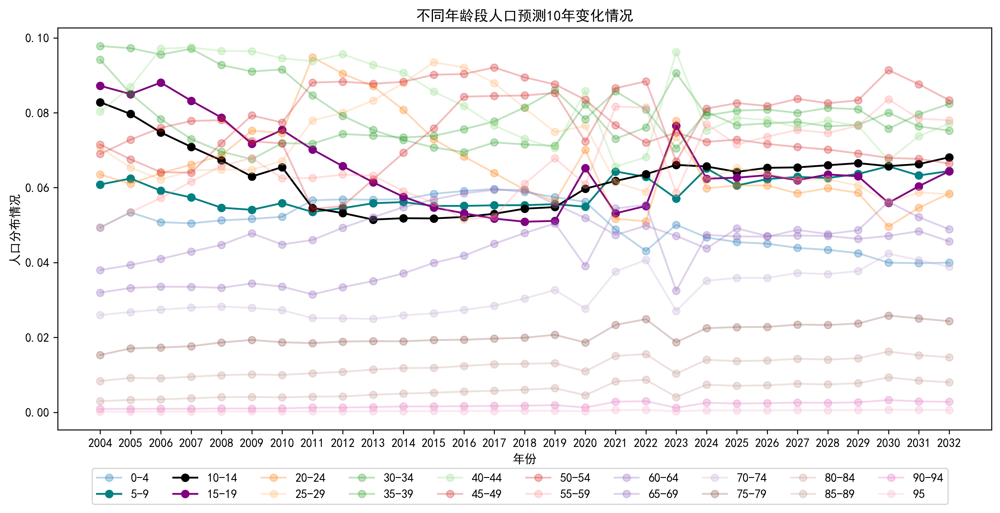

In [40]:
model = VAR(diff_1_df)
result = model.fit(15, method='ols', trend='ctt')

res = result.forecast(train_df.values, 10)

first = 2023
predicted_df = pd.DataFrame(res, columns=train_df.columns, index=range(first, first + len(res)))
res_df = pd.concat([train_df, predicted_df])
index = train_df.index.append(predicted_df.index)
res_df = pd.DataFrame(
    std.inverse_transform(res_df), 
    index=index, 
    columns=train_df.columns
)

tgt_cols = ['5-9', '10-14', '15-19']
tgt_color = {col: color for col, color in zip(tgt_cols, ['teal', 'black', 'purple'])}
plt.figure(figsize=(12, 6), dpi=300)
for i, (index, row) in enumerate(res_df.T.iterrows()):
    x = [index for index in row.index]
    y = row.values.reshape(-1, 1)
    if index in tgt_cols:
        plt.plot(x, y, marker='o', label=index, color=tgt_color[index])
    else:
        plt.plot(x, y, marker='o', label=index, color=cmap(i / len(y)), alpha=0.3)

plt.legend(loc='lower right', bbox_to_anchor=(0.96, -0.2), ncol=10)

plt.title('不同年龄段人口预测10年变化情况')
plt.xlabel('年份')
plt.ylabel('人口分布情况')

plt.tight_layout()

plt.show()

In [41]:
res_df

,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95
2004,0.049378,0.060828,0.082814,0.087193,0.063527,0.070619,0.094132,0.097819,0.080279,0.071512,0.068981,0.049299,0.037986,0.031971,0.025967,0.015290,0.008355,0.002974,0.000890,0.000187
2005,0.053404,0.062444,0.079670,0.084982,0.061035,0.065366,0.085125,0.097228,0.086869,0.067561,0.072822,0.053423,0.039345,0.033210,0.026784,0.017083,0.009191,0.003331,0.000932,0.000195
2006,0.050774,0.059185,0.074737,0.088057,0.063857,0.062138,0.078310,0.095544,0.097077,0.064139,0.075970,0.057247,0.040989,0.033535,0.027411,0.017299,0.009076,0.003473,0.000947,0.000234
2007,0.050470,0.057373,0.070897,0.083211,0.066121,0.064568,0.072979,0.097070,0.097454,0.064005,0.077798,0.061598,0.042901,0.033522,0.027959,0.017653,0.009508,0.003732,0.000945,0.000236
2008,0.051258,0.054646,0.067269,0.078715,0.068633,0.064841,0.069602,0.092741,0.096484,0.071871,0.078028,0.065806,0.044722,0.033248,0.028257,0.018660,0.009916,0.004053,0.001022,0.000228
2009,0.051638,0.054078,0.062970,0.071688,0.075226,0.064791,0.067585,0.091023,0.096444,0.079286,0.072391,0.067910,0.047803,0.034433,0.027891,0.019338,0.010124,0.004110,0.001008,0.000264
2010,0.052229,0.055883,0.065473,0.075410,0.074580,0.067095,0.071876,0.091560,0.094544,0.077381,0.071805,0.062479,0.044821,0.033577,0.027260,0.018713,0.009993,0.004008,0.001058,0.000258
2011,0.056610,0.053509,0.054559,0.070195,0.094801,0.077941,0.071732,0.084609,0.093774,0.088065,0.054317,0.062580,0.046025,0.031482,0.025171,0.018489,0.010447,0.004188,0.001255,0.000253
2012,0.056889,0.054513,0.053212,0.065721,0.090465,0.079967,0.074321,0.079183,0.095613,0.088304,0.055053,0.063488,0.049283,0.033414,0.025096,0.018895,0.010801,0.004250,0.001279,0.000252
2013,0.056767,0.055833,0.051467,0.061439,0.087091,0.083274,0.073922,0.075404,0.092782,0.087738,0.062170,0.063230,0.052087,0.035063,0.024950,0.019002,0.011417,0.004699,0.001393,0.000272


In [42]:
rate_df = br_dr_ngr_df[::-1].copy()
std2 = StandardScaler()
r_df = pd.DataFrame(std2.fit_transform(rate_df), columns=rate_df.columns, index=[idx.split('年')[0] for idx in rate_df.index])
r_df

指标,人口出生率(‰),人口死亡率(‰),人口自然增长率(‰)
2004,0.385557,-2.287694,0.624247
2005,0.433861,-1.967736,0.632453
2006,0.297731,-0.901213,0.382180
2007,0.302122,-0.474603,0.337048
2008,0.319687,-0.012443,0.300123
2009,0.236252,0.058659,0.213963
2010,0.214296,0.165311,0.181140
2011,0.815905,0.271964,0.730921
2012,1.386775,0.236413,1.264291
2013,0.710514,0.236413,0.636556


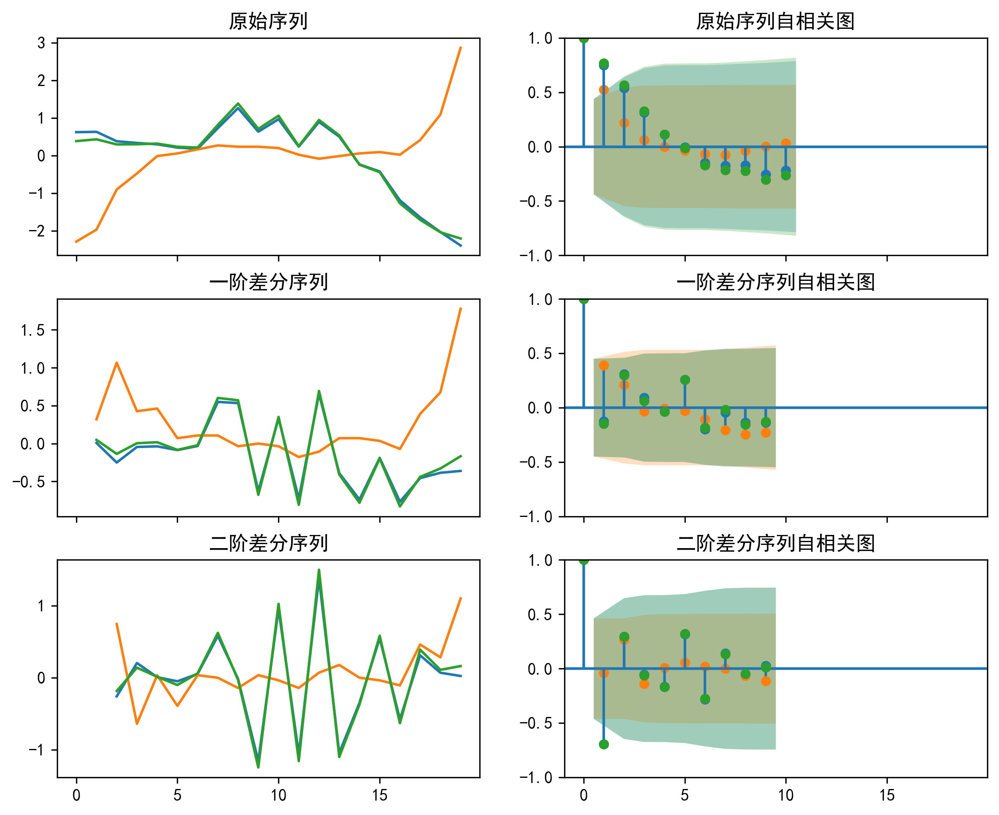

In [43]:
fig, axes = plt.subplots(3, 2, sharex=True, figsize=(10, 8), dpi=300)
for col in r_df.columns[::-1]:
    df = r_df.loc[:, col]
    axes[0, 0].plot(df.values); axes[0, 0].set_title('原始序列')
    plot_acf(df.values, ax=axes[0, 1], title='原始序列自相关图')

    # 1st Differencing
    axes[1, 0].plot(df.diff().values); axes[1, 0].set_title('一阶差分序列')
    plot_acf(df.diff().dropna().values, ax=axes[1, 1], title='一阶差分序列自相关图')

    # 2nd Differencing
    axes[2, 0].plot(df.diff().diff().values), axes[2, 0].set_title('二阶差分序列')
    plot_acf(df.diff().diff().dropna().values, ax=axes[2, 1], title='二阶差分序列自相关图')
plt.show()

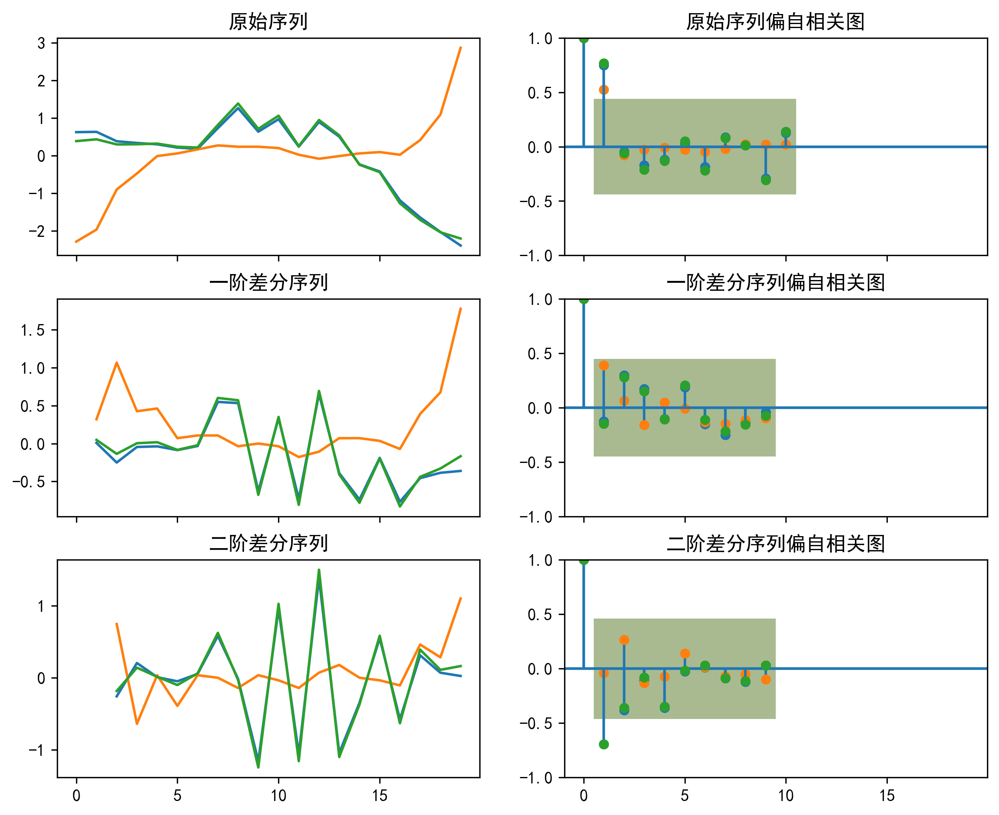

In [44]:
fig, axes = plt.subplots(3, 2, sharex=True, figsize=(10, 8), dpi=300)
for col in r_df.columns[::-1]:
    df = r_df.loc[:, col]
    axes[0, 0].plot(df.values); axes[0, 0].set_title('原始序列')
    plot_pacf(df.values, ax=axes[0, 1], title='原始序列偏自相关图')

    # 1st Differencing
    axes[1, 0].plot(df.diff().values); axes[1, 0].set_title('一阶差分序列')
    plot_pacf(df.diff().dropna().values, ax=axes[1, 1], title='一阶差分序列偏自相关图')

    # 2nd Differencing
    axes[2, 0].plot(df.diff().diff().values), axes[2, 0].set_title('二阶差分序列')
    plot_pacf(df.diff().diff().dropna().values, ax=axes[2, 1], title='二阶差分序列偏自相关图')
plt.show()

In [45]:
r_tr = r_df.diff().dropna()

In [46]:
r_model = VAR(r_df)
r_tr_res = r_model.fit(maxlags=2, trend='c')
r_pred = r_tr_res.forecast(r_df.values, steps=9)

first = 2024
predicted_df = pd.DataFrame(r_pred, columns=r_df.columns, index=range(first, first + len(r_pred)))
res_df_2 = pd.concat([r_df, predicted_df])
index = r_df.index.append(predicted_df.index)
res_df_2 = pd.DataFrame(
    std2.inverse_transform(res_df_2),
    index=index, 
    columns=predicted_df.columns
)
res_df_2

/home/drew/miniconda3/envs/mathmodel/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


指标,人口出生率(‰),人口死亡率(‰),人口自然增长率(‰)
2004,12.290000,6.420000,5.870000
2005,12.400000,6.510000,5.890000
2006,12.090000,6.810000,5.280000
2007,12.100000,6.930000,5.170000
2008,12.140000,7.060000,5.080000
2009,11.950000,7.080000,4.870000
2010,11.900000,7.110000,4.790000
2011,13.270000,7.140000,6.130000
2012,14.570000,7.130000,7.430000
2013,13.030000,7.130000,5.900000


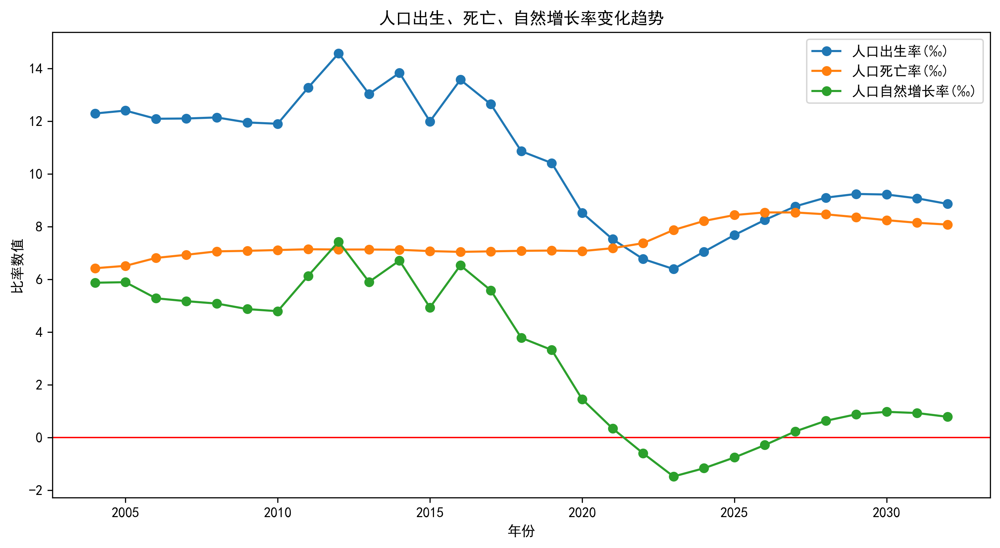

In [47]:
plt.figure(figsize=(12, 6), dpi=300)
plt.axhline(y=0, color='red', linewidth=1)
for index, row in res_df_2.T.iterrows():
    if index in drop_columns:
        continue
    x = row.index[::-1]
    y = row[::-1]
    plt.plot(x, y, marker='o', label=index)
plt.xlabel('年份')
plt.ylabel('比率数值')
plt.title('人口出生、死亡、自然增长率变化趋势')
plt.legend()
plt.show()

In [48]:
tp_df.head()

指标,年末总人口(万人),男性人口(万人),女性人口(万人),城镇人口(万人),乡村人口(万人)
2023年,140967.0,72032.0,68935.0,93267.0,47700.0
2022年,141175.0,72206.0,68969.0,92071.0,49104.0
2021年,141260.0,72311.0,68949.0,91425.0,49835.0
2020年,141212.0,72357.0,68855.0,90220.0,50992.0
2019年,141008.0,72039.0,68969.0,88426.0,52582.0


In [49]:
def get_pop(last, rate):
    return last * (1 + rate/1000)

pop_list = list(tp_df[::-1].iloc[:, 0].values)
cur_pop = pop_list[-1]
for rate in res_df_2.loc[2024:, '人口自然增长率(‰)']:
    cur_pop = get_pop(cur_pop, rate)
    pop_list.append(cur_pop)
pop_df = pd.DataFrame(pop_list, index=res_df_2.index, columns=['population'])

In [50]:
res_df

,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90-94,95
2004,0.049378,0.060828,0.082814,0.087193,0.063527,0.070619,0.094132,0.097819,0.080279,0.071512,0.068981,0.049299,0.037986,0.031971,0.025967,0.015290,0.008355,0.002974,0.000890,0.000187
2005,0.053404,0.062444,0.079670,0.084982,0.061035,0.065366,0.085125,0.097228,0.086869,0.067561,0.072822,0.053423,0.039345,0.033210,0.026784,0.017083,0.009191,0.003331,0.000932,0.000195
2006,0.050774,0.059185,0.074737,0.088057,0.063857,0.062138,0.078310,0.095544,0.097077,0.064139,0.075970,0.057247,0.040989,0.033535,0.027411,0.017299,0.009076,0.003473,0.000947,0.000234
2007,0.050470,0.057373,0.070897,0.083211,0.066121,0.064568,0.072979,0.097070,0.097454,0.064005,0.077798,0.061598,0.042901,0.033522,0.027959,0.017653,0.009508,0.003732,0.000945,0.000236
2008,0.051258,0.054646,0.067269,0.078715,0.068633,0.064841,0.069602,0.092741,0.096484,0.071871,0.078028,0.065806,0.044722,0.033248,0.028257,0.018660,0.009916,0.004053,0.001022,0.000228
2009,0.051638,0.054078,0.062970,0.071688,0.075226,0.064791,0.067585,0.091023,0.096444,0.079286,0.072391,0.067910,0.047803,0.034433,0.027891,0.019338,0.010124,0.004110,0.001008,0.000264
2010,0.052229,0.055883,0.065473,0.075410,0.074580,0.067095,0.071876,0.091560,0.094544,0.077381,0.071805,0.062479,0.044821,0.033577,0.027260,0.018713,0.009993,0.004008,0.001058,0.000258
2011,0.056610,0.053509,0.054559,0.070195,0.094801,0.077941,0.071732,0.084609,0.093774,0.088065,0.054317,0.062580,0.046025,0.031482,0.025171,0.018489,0.010447,0.004188,0.001255,0.000253
2012,0.056889,0.054513,0.053212,0.065721,0.090465,0.079967,0.074321,0.079183,0.095613,0.088304,0.055053,0.063488,0.049283,0.033414,0.025096,0.018895,0.010801,0.004250,0.001279,0.000252
2013,0.056767,0.055833,0.051467,0.061439,0.087091,0.083274,0.073922,0.075404,0.092782,0.087738,0.062170,0.063230,0.052087,0.035063,0.024950,0.019002,0.011417,0.004699,0.001393,0.000272


In [78]:
using_df = res_df[['0-4'] + tgt_cols + ['20-24']]
color = ['slategray', 'teal', 'black', 'purple', 'coral']
using_df['prob_sum'] = using_df.apply(lambda x: sum(x[1:4]), axis=1)
using_df['pop_total'] = pop_list
using_df['pop_cnt'] = using_df.apply(lambda x: x[-1] * x[-2], axis=1)
using_df.to_csv('./data/pop_sum.csv')
using_df

,0-4,5-9,10-14,15-19,20-24,prob_sum,pop_total,pop_cnt
2004,0.049378,0.060828,0.082814,0.087193,0.063527,0.230835,129988.000000,30005.753084
2005,0.053404,0.062444,0.079670,0.084982,0.061035,0.227097,130756.000000,29694.252983
2006,0.050774,0.059185,0.074737,0.088057,0.063857,0.221979,131448.000000,29178.716972
2007,0.050470,0.057373,0.070897,0.083211,0.066121,0.211481,132129.000000,27942.805009
2008,0.051258,0.054646,0.067269,0.078715,0.068633,0.200630,132802.000000,26644.102646
2009,0.051638,0.054078,0.062970,0.071688,0.075226,0.188736,133450.000000,25186.842374
2010,0.052229,0.055883,0.065473,0.075410,0.074580,0.196767,134091.000000,26384.638854
2011,0.056610,0.053509,0.054559,0.070195,0.094801,0.178263,134916.000000,24050.484731
2012,0.056889,0.054513,0.053212,0.065721,0.090465,0.173446,135922.000000,23575.133037
2013,0.056767,0.055833,0.051467,0.061439,0.087091,0.168739,136726.000000,23070.975998


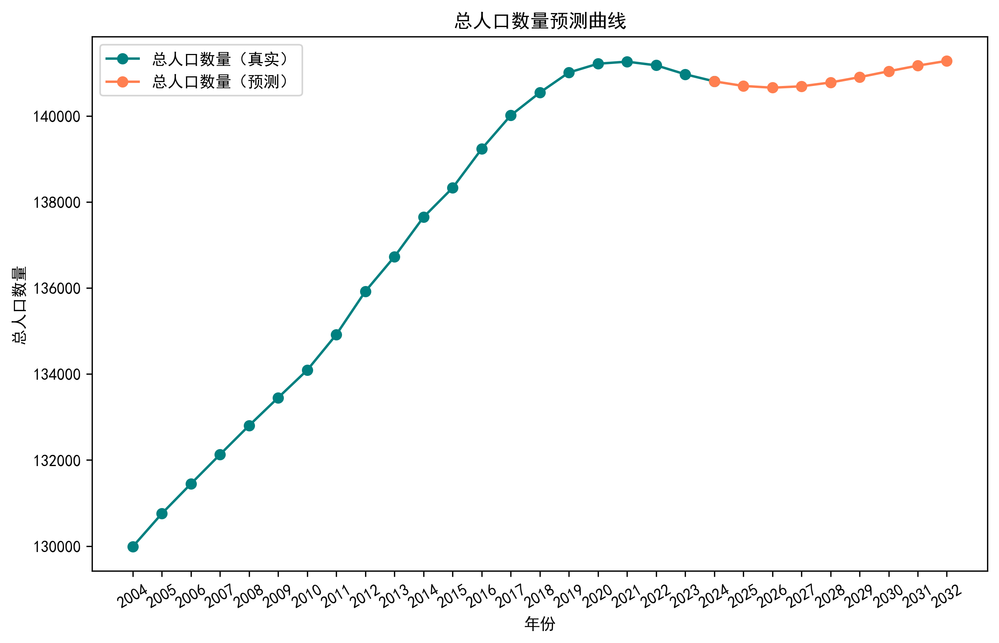

In [52]:
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(pop_df.index[:21].astype(str), pop_df[:21], marker='o', color='teal', label='总人口数量（真实）')
plt.plot(pop_df.index[20:].astype(str), pop_df[20:], marker='o', color='coral', label='总人口数量（预测）')
plt.ylabel('总人口数量')
plt.xlabel('年份')
plt.title('总人口数量预测曲线')
plt.xticks(rotation=30)
plt.legend()
plt.show()

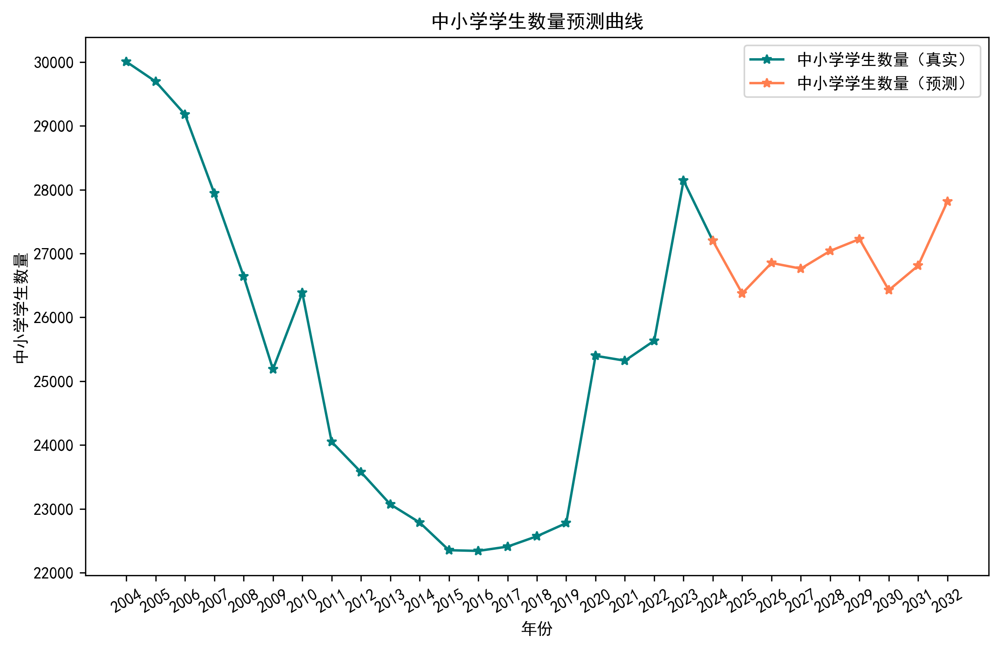

In [53]:
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(using_df.index[:21].astype(str), using_df.iloc[:21, -1], marker='*', color='teal', label='中小学学生数量（真实）')
plt.plot(using_df.index[20:].astype(str), using_df.iloc[20:, -1], marker='*', color='coral', label='中小学学生数量（预测）')
plt.ylabel('中小学学生数量')
plt.xlabel('年份')
plt.title('中小学学生数量预测曲线')
plt.xticks(rotation=30)
plt.legend()
plt.show()

In [54]:
cur_data = '北京数据'
# 人口出生率，死亡率和自然增长率
bj_rate_df = pd.read_csv(join(data_root, cur_data, '北京出生率，死亡率，自然增长率.csv'), 
                           header=3, index_col=0).iloc[:-1, :].T
# 人口年龄结果和抚养比
bj_age_df = pd.read_csv(join(data_root, cur_data, '北京人口年龄结构和抚养比.csv'), 
                        header=3, index_col=0).iloc[:-2, :].T
# 总人口
bj_pop_df = pd.read_csv(join(data_root, cur_data, '北京总人口.csv'), 
                    header=3, index_col=0).iloc[:-2, :].T
# 按年龄分人口数
bj_pop_age_df = pd.read_csv(join(data_root, cur_data, '北京按年龄分人口数.csv'), 
                      header=0, index_col=0).iloc[:, :].T

In [55]:
bj_pop_age_df.head()

指标,人口数(人口抽样调查)(万人),0-4岁人口数(人口抽样调查)(万人),5-9岁人口数(人口抽样调查)(万人),10-14岁人口数(人口抽样调查)(万人),15-19岁人口数(人口抽样调查)(万人),20-24岁人口数(人口抽样调查)(万人),25-29岁人口数(人口抽样调查)(万人),30-34岁人口数(人口抽样调查)(万人),35-39岁人口数(人口抽样调查)(万人),40-44岁人口数(人口抽样调查)(万人),45-49岁人口数(人口抽样调查)(万人),50-54岁人口数(人口抽样调查)(万人),55-59岁人口数(人口抽样调查)(万人),60-64岁人口数(人口抽样调查)(万人),65-69岁人口数(人口抽样调查)(万人),70-74岁人口数(人口抽样调查)(万人),75-79岁人口数(人口抽样调查)(万人),80-84岁人口数(人口抽样调查)(万人),85-89岁人口数(人口抽样调查)(万人),95岁以上人口数(人口抽样调查)(万人)
2023年,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022年,2184.3,82.3,104.8,76.9,51.9,116.6,173.9,230.5,220.7,180.1,145.0,172.8,163.7,135.0,133.7,82.7,46.4,34.3,33.0,NaN
2021年,2188.6,93.2,100.8,70.7,54.9,127.5,182.5,242.9,218.9,166.1,153.8,166.1,169.6,130.0,128.1,73.7,43.9,34.9,31.0,NaN
2020年,2189.3,101.6,93.3,64.2,63.4,135.0,190.5,250.3,214.3,160.2,161.9,162.0,162.7,138.7,119.5,66.8,41.5,34.9,28.5,NaN
2019年,2153.6,87.5,81.3,57.9,44.1,137.3,243.2,237.6,212.4,165.1,183.0,182.8,150.1,125.3,84.7,58.7,42.2,34.0,26.4,NaN


In [56]:
bj_pop_age_df.isna().any(axis=1)

2023年     True
2022年     True
2021年     True
2020年     True
2019年     True
2018年     True
2017年     True
2016年     True
2015年     True
2014年     True
2013年     True
2012年     True
2011年     True
2010年    False
2009年    False
2008年    False
2007年    False
2006年    False
2005年     True
2004年    False
dtype: bool

In [57]:
modify_col = ['人口数'] + [col.split('岁')[0] for col in bj_pop_age_df.columns][1:]
bj_pop_age_df.columns = modify_col
bj_pop_age_df.index = [idx.split('年')[0] for idx in bj_pop_age_df.index]
bj_pop_age_df

,人口数,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,95
2023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022,2184.3,82.3000,104.8000,76.9000,51.9000,116.6000,173.900,230.5000,220.7000,180.1000,145.0000,172.8000,163.7000,135.0000,133.7000,82.7000,46.400,34.3000,33.0000,NaN
2021,2188.6,93.2000,100.8000,70.7000,54.9000,127.5000,182.500,242.9000,218.9000,166.1000,153.8000,166.1000,169.6000,130.0000,128.1000,73.7000,43.900,34.9000,31.0000,NaN
2020,2189.3,101.6000,93.3000,64.2000,63.4000,135.0000,190.500,250.3000,214.3000,160.2000,161.9000,162.0000,162.7000,138.7000,119.5000,66.8000,41.500,34.9000,28.5000,NaN
2019,2153.6,87.5000,81.3000,57.9000,44.1000,137.3000,243.200,237.6000,212.4000,165.1000,183.0000,182.8000,150.1000,125.3000,84.7000,58.7000,42.200,34.0000,26.4000,NaN
2018,2154.2,91.7000,79.0000,55.9000,47.2000,141.3000,247.700,235.0000,210.8000,166.8000,183.0000,180.7000,150.3000,123.4000,84.0000,56.7000,42.100,34.3000,24.3000,NaN
2017,2170.7,95.3000,78.1000,53.0000,52.2000,164.6000,254.400,235.1000,204.1000,166.5000,183.5000,179.5000,146.2000,120.6000,82.9000,54.8000,43.700,34.4000,21.8000,NaN
2016,2172.9,96.4000,75.5000,51.9000,59.2000,191.6000,256.900,236.8000,187.9000,171.0000,175.9000,177.8000,143.6000,118.0000,80.4000,52.9000,44.300,33.2000,19.6000,NaN
2015,2170.5,93.8000,74.0000,51.3000,71.4000,207.7000,254.100,233.2000,177.1000,177.2000,170.7000,169.3000,150.2000,117.7000,76.7000,50.6000,45.700,31.6000,18.2000,NaN
2014,2151.6,90.6000,71.4000,51.0000,84.6000,223.7000,243.600,229.7000,168.2000,183.6000,170.8000,161.5000,151.3000,109.3000,71.5000,49.5000,45.600,29.3000,16.4000,NaN


In [58]:
bj_pop_df.head()

指标,年末常住人口(万人),城镇人口(万人),乡村人口(万人)
2023年,2186.0,NaN,NaN
2022年,2184.0,1913.0,271.0
2021年,2189.0,1916.0,273.0
2020年,2189.0,1916.0,273.0
2019年,2190.0,1913.0,277.0


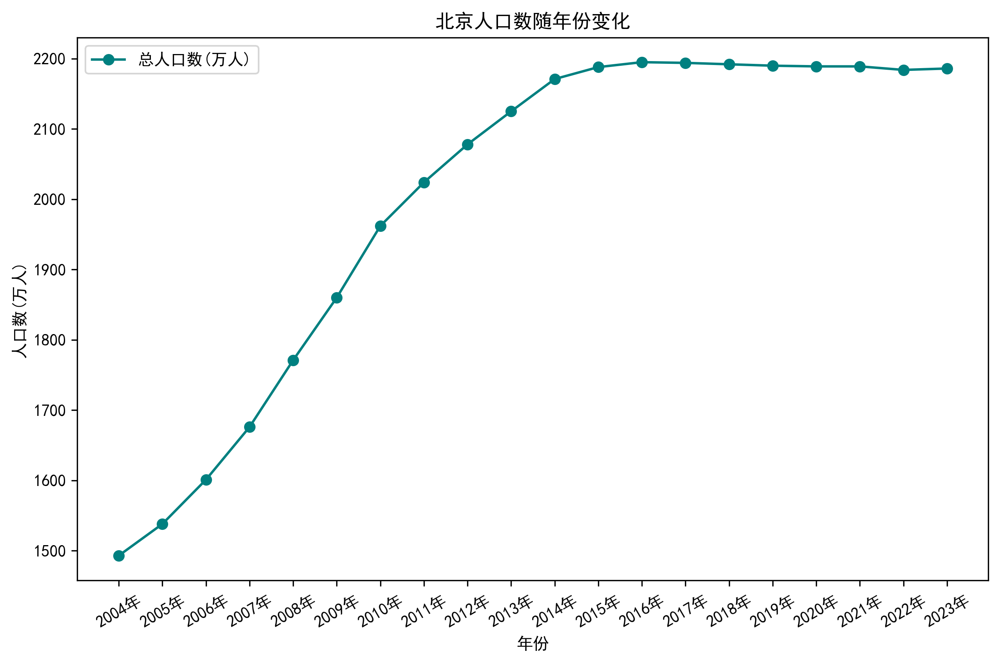

In [59]:
plt.figure(figsize=(10, 6), dpi=300)
bj_total_population = bj_pop_df.iloc[:, 0]
plt.plot(
    bj_total_population.index[::-1], 
    bj_total_population[::-1], 
    marker='o', label='总人口数(万人)', color='teal'
)
plt.xticks(rotation=30)
plt.title('北京人口数随年份变化')
plt.xlabel('年份')
plt.ylabel('人口数(万人)')
plt.legend()

In [60]:
bj_r_df = bj_rate_df[::-1]
std3 = StandardScaler()
bj_r_df = pd.DataFrame(
    std3.fit_transform(bj_r_df), 
    index=[idx.split('年')[0] for idx in bj_r_df.index], 
    columns=bj_r_df.columns
)
bj_r_df

指标,人口出生率(‰),人口死亡率(‰),人口自然增长率(‰)
2004,-1.467227,0.933365,-1.508112
2005,-1.308532,0.475584,-1.236373
2006,-1.333589,-0.050865,-1.097020
2007,0.386992,-0.165310,0.373157
2008,0.261706,-0.554424,0.387092
2009,0.169831,-0.989316,0.442834
2010,-0.314605,-1.332652,0.143224
2011,0.361934,-1.653099,0.805152
2012,0.996712,-1.561542,1.306824
2013,0.896484,-1.080872,1.076891


In [61]:
bj_r_model = VAR(bj_r_df)
bj_r_tr_res = bj_r_model.fit(maxlags=3, trend='c')
bj_r_pred = bj_r_tr_res.forecast(bj_r_df.values, steps=10)

first = 2023
bj_predicted_df = pd.DataFrame(
    bj_r_pred, columns=bj_r_df.columns, index=range(first, first + len(bj_r_pred)))
res_df_bj = pd.concat([bj_r_df, bj_predicted_df])
index = bj_r_df.index.append(bj_predicted_df.index)
res_df_bj = pd.DataFrame(
    std3.inverse_transform(res_df_bj),
    index=index, 
    columns=bj_predicted_df.columns
)
res_df_bj

/home/drew/miniconda3/envs/mathmodel/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


指标,人口出生率(‰),人口死亡率(‰),人口自然增长率(‰)
2004,6.100000,5.400000,0.700000
2005,6.290000,5.200000,1.090000
2006,6.260000,4.970000,1.290000
2007,8.320000,4.920000,3.400000
2008,8.170000,4.750000,3.420000
2009,8.060000,4.560000,3.500000
2010,7.480000,4.410000,3.070000
2011,8.290000,4.270000,4.020000
2012,9.050000,4.310000,4.740000
2013,8.930000,4.520000,4.410000


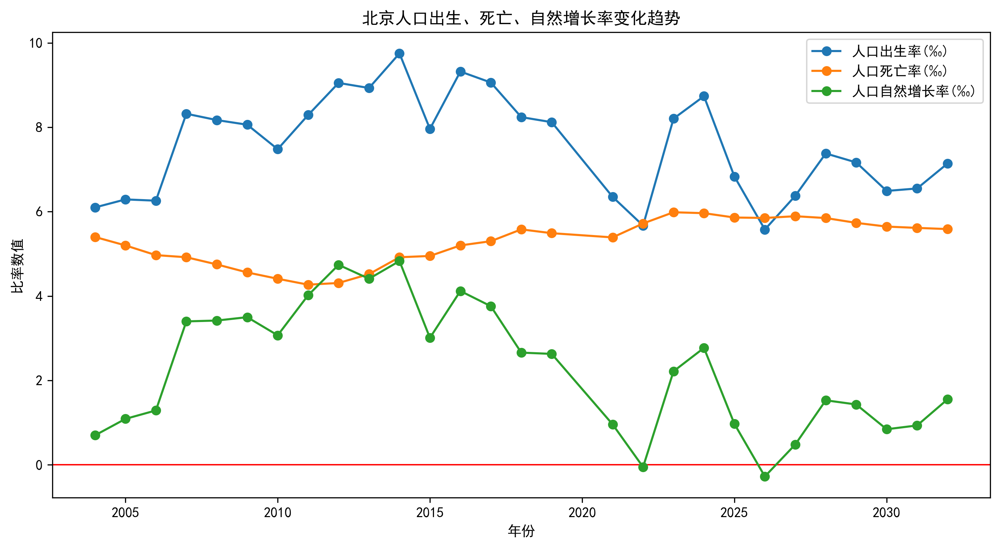

In [62]:
plt.figure(figsize=(12, 6), dpi=300)
plt.axhline(y=0, color='red', linewidth=1)
for index, row in res_df_bj.T.iterrows():
    if index in drop_columns:
        continue
    x = row.index[::-1]
    y = row[::-1]
    plt.plot(x, y, marker='o', label=index)
plt.xlabel('年份')
plt.ylabel('比率数值')
plt.title('北京人口出生、死亡、自然增长率变化趋势')
plt.legend()
plt.show()

In [63]:
bj_pop_df.head()

指标,年末常住人口(万人),城镇人口(万人),乡村人口(万人)
2023年,2186.0,NaN,NaN
2022年,2184.0,1913.0,271.0
2021年,2189.0,1916.0,273.0
2020年,2189.0,1916.0,273.0
2019年,2190.0,1913.0,277.0


In [64]:
def get_pop(last, rate):
    return last * (1 + rate/1000)

bj_pop_list = list(bj_pop_df[::-1].iloc[:-1, 0].values)
bj_cur_pop = bj_pop_list[-1]
for idx, rate in enumerate(res_df_bj.loc[2023:, '人口自然增长率(‰)']):
    bj_cur_pop = get_pop(bj_cur_pop, rate)
    bj_pop_list.append(bj_cur_pop)

bj_pop_df = pd.DataFrame(
    bj_pop_list[:-1], 
    index=res_df_bj.index, 
    columns=['population']
)
bj_pop_df.head()

,population
2004,1493.0
2005,1538.0
2006,1601.0
2007,1676.0
2008,1771.0


In [65]:
bj_train_df = bj_pop_age_df[::-1].iloc[:-1, :]
bj_train_df.fillna(0, inplace=True)
bj_train_df.head()

,人口数,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,95
2004,1492.7,38.8102,46.2737,62.6934,122.4014,150.7627,119.416,132.8503,131.3576,152.2554,132.8503,105.9817,70.1569,61.2007,64.1861,50.7518,29.854,13.4343,5.9708,1.4927
2005,1538.0,45.7000,51.7000,59.6000,111.1000,152.9000,133.600,140.0000,138.0000,151.7000,133.7000,119.4000,76.3000,58.3000,62.7000,51.6000,30.200,21.5000,0.0000,0.0000
2006,1581.0,49.0110,49.0110,60.0780,107.5080,167.5860,154.938,131.2230,143.8710,148.6140,121.7370,123.3180,88.5360,58.4970,61.6590,56.9160,33.201,17.3910,6.3240,1.5810
2007,1633.0,55.5220,47.3570,55.5220,109.4110,173.0980,177.997,138.8050,153.5020,155.1350,120.8420,125.7410,96.3470,58.7880,55.5220,50.6230,34.293,16.3300,6.5320,1.6330
2008,1695.0,64.4100,49.1550,50.8500,94.9200,166.1100,194.925,142.3800,157.6350,145.7700,140.6850,142.3800,106.7850,66.1050,52.5450,55.9350,35.595,20.3400,6.7800,1.6950


In [66]:
std4 = StandardScaler()
bj_train_df.iloc[:, 1:] = std4.fit_transform(
    bj_train_df.iloc[:, 1:].apply(lambda x: x/bj_train_df.iloc[:, 0]))
bj_train_df.drop(['人口数'], axis=1, inplace=True)
bj_train_df

,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,95
2004,-2.407474,-0.500980,2.218281,2.026821,0.296855,-1.782741,-0.974929,-0.315735,2.240080,1.373892,-0.796888,-2.261909,-0.807816,0.465141,1.097613,-0.335389,-1.620534,-0.851262,1.017168
2005,-1.703054,-0.062589,1.646242,1.502664,0.230204,-1.326212,-0.790147,-0.078035,1.804937,1.041142,0.279591,-1.929899,-1.146306,0.234477,1.001557,-0.607051,0.375977,-1.827783,-0.638283
2006,-1.459121,-0.500980,1.513881,1.275213,0.507088,-0.585908,-1.521806,0.097197,1.205690,-0.556098,0.339102,-1.116993,-1.245477,0.051907,1.524591,0.410714,-0.818593,-0.851262,1.017168
2007,-0.890109,-0.836259,0.809481,1.221527,0.507088,0.145491,-1.339514,0.510129,1.334989,-1.038595,0.176818,-0.735354,-1.354893,-0.464635,0.457146,0.410714,-1.219563,-0.851262,1.017168
2008,-0.131427,-0.836259,0.105081,0.630978,0.170715,0.544435,-1.430660,0.372485,0.171300,0.408897,1.312808,-0.226503,-1.026647,-0.774560,0.884124,0.410714,-0.417622,-0.851262,1.017168
2009,0.247914,-0.668620,0.281181,0.362547,0.549135,0.610926,-1.430660,0.647773,0.042001,1.052227,-0.310035,-0.608141,-1.026647,-1.084485,0.457146,3.395123,-0.818593,-0.851262,2.672619
2010,-0.704501,-1.423904,-0.679342,0.556323,1.695096,0.960155,-0.609953,-0.342798,-0.024059,0.410570,-1.181267,-0.424704,-1.098437,-1.264300,-0.663768,-0.572778,-1.140236,-0.869287,1.556380
2011,-0.075689,-1.105283,-0.720022,0.403807,1.282540,0.622204,-0.471714,-1.027398,0.164920,1.090614,-1.514056,0.216417,-0.588974,-1.121374,-0.851814,0.007613,-0.740051,-0.400687,-0.638283
2012,0.131324,-0.893754,-0.607982,0.208586,1.219363,0.712502,-0.343635,-1.346644,0.217551,0.544765,-1.770947,0.304290,-0.196643,-0.891797,-1.043796,0.030217,-0.695025,-0.270484,-0.638283
2013,0.311413,-0.410518,-1.164291,0.107296,1.074348,1.273796,1.213770,-1.689206,-0.163307,-1.099071,-1.752331,-0.360790,-0.202834,-0.308471,-1.113514,-1.745179,-1.418266,-0.557955,-0.638283


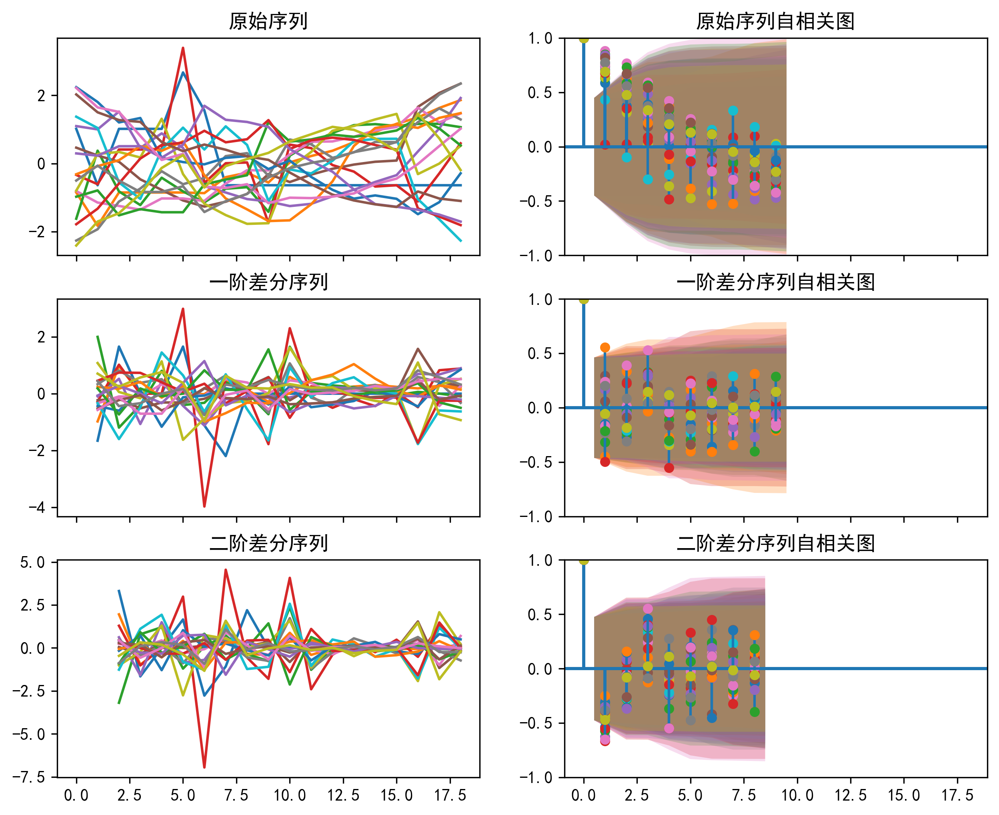

In [67]:
fig, axes = plt.subplots(3, 2, sharex=True, figsize=(10, 8), dpi=300)
for col in bj_train_df.columns[::-1]:
    df = bj_train_df.loc[:, col]
    axes[0, 0].plot(df.values); axes[0, 0].set_title('原始序列')
    plot_acf(df.values, ax=axes[0, 1], title='原始序列自相关图')

    # 1st Differencing
    axes[1, 0].plot(df.diff().values); axes[1, 0].set_title('一阶差分序列')
    plot_acf(df.diff().dropna().values, ax=axes[1, 1], title='一阶差分序列自相关图')

    # 2nd Differencing
    axes[2, 0].plot(df.diff().diff().values), axes[2, 0].set_title('二阶差分序列')
    plot_acf(df.diff().diff().dropna().values, ax=axes[2, 1], title='二阶差分序列自相关图')
plt.show()

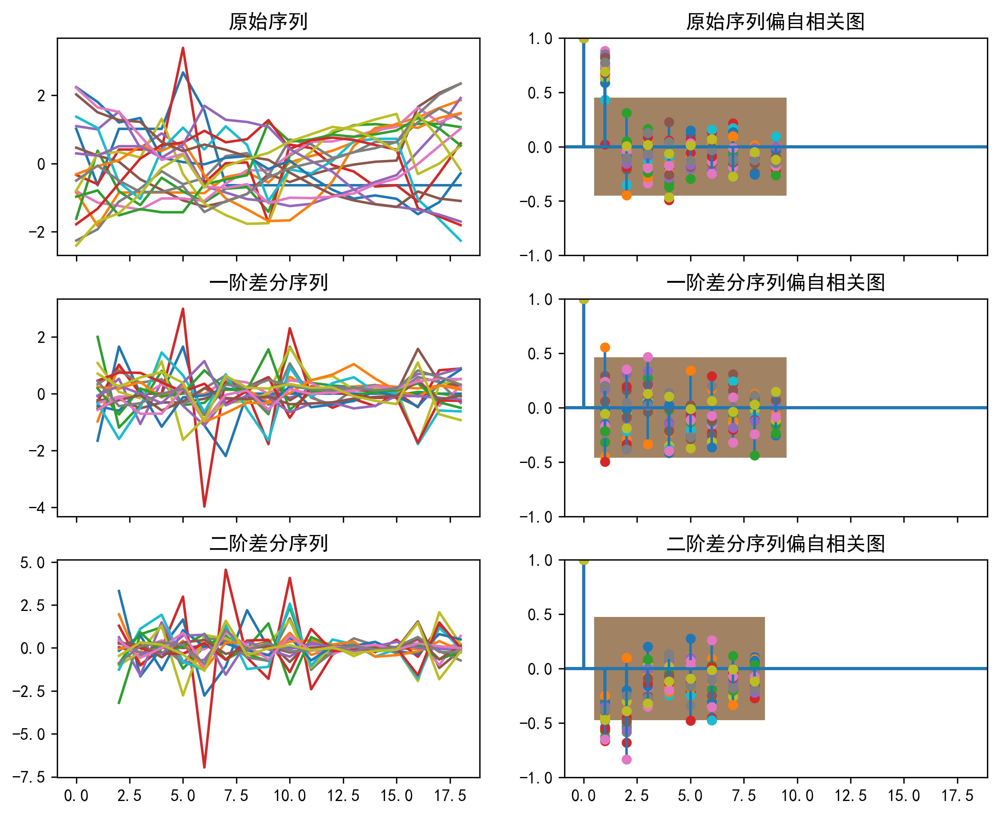

In [68]:
fig, axes = plt.subplots(3, 2, sharex=True, figsize=(10, 8), dpi=300)
for col in bj_train_df.columns[::-1]:
    df = bj_train_df.loc[:, col]
    axes[0, 0].plot(df.values); axes[0, 0].set_title('原始序列')
    plot_pacf(df.values, ax=axes[0, 1], title='原始序列偏自相关图')

    # 1st Differencing
    axes[1, 0].plot(df.diff().values); axes[1, 0].set_title('一阶差分序列')
    plot_pacf(df.diff().dropna().values, ax=axes[1, 1], title='一阶差分序列偏自相关图')

    # 2nd Differencing
    axes[2, 0].plot(df.diff().diff().values), axes[2, 0].set_title('二阶差分序列')
    plot_pacf(df.diff().diff().dropna().values, ax=axes[2, 1], title='二阶差分序列偏自相关图')
plt.show()

In [69]:
bj_diff_1_df = bj_train_df.diff().dropna()
bj_diff_1_df

,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,95
2005,0.704420,4.383915e-01,-0.572039,-0.524157,-0.066651,0.456530,0.184782,0.237700,-0.435143,-0.332750,1.076479,0.332011,-3.384904e-01,-0.230664,-0.096056,-2.716627e-01,1.996511,-0.976521,-1.655451
2006,0.243933,-4.383915e-01,-0.132361,-0.227451,0.276884,0.740304,-0.731659,0.175232,-0.599247,-1.597240,0.059511,0.812905,-9.917100e-02,-0.182570,0.523034,1.017765e+00,-1.194570,0.976521,1.655451
2007,0.569012,-3.352790e-01,-0.704400,-0.053686,0.000000,0.731398,0.182292,0.412932,0.129299,-0.482497,-0.162284,0.381639,-1.094153e-01,-0.516542,-1.067445,-2.609024e-15,-0.400971,0.000000,0.000000
2008,0.758682,5.551115e-16,-0.704400,-0.590549,-0.336373,0.398945,-0.091146,-0.137644,-1.163689,1.447492,1.135990,0.508852,3.282460e-01,-0.309925,0.426978,0.000000e+00,0.801942,0.000000,0.000000
2009,0.379341,1.676395e-01,0.176100,-0.268431,0.378420,0.066491,0.000000,0.275288,-0.129299,0.643330,-1.622843,-0.381639,-8.881784e-16,-0.309925,-0.426978,2.984409e+00,-0.400971,0.000000,1.655451
2010,-0.952415,-7.552839e-01,-0.960523,0.193776,1.145961,0.349229,0.820706,-0.990570,-0.066060,-0.641657,-0.871232,0.183438,-7.179057e-02,-0.179815,-1.120915,-3.967900e+00,-0.321643,-0.018025,-1.116239
2011,0.628812,3.186206e-01,-0.040681,-0.152516,-0.412555,-0.337951,0.138239,-0.684600,0.188979,0.680044,-0.332789,0.641121,5.094628e-01,0.142926,-0.188045,5.803908e-01,0.400185,0.468600,-2.194663
2012,0.207013,2.115291e-01,0.112040,-0.195221,-0.063177,0.090297,0.128079,-0.319247,0.052631,-0.545850,-0.256892,0.087873,3.923309e-01,0.229577,-0.191983,2.260408e-02,0.045026,0.130203,0.000000
2013,0.180089,4.832363e-01,-0.556309,-0.101290,-0.145015,0.561295,1.557406,-0.342562,-0.380858,-1.643836,0.018616,-0.665080,-6.190648e-03,0.583327,-0.069717,-1.775396e+00,-0.723242,-0.287471,0.000000
2014,0.336365,2.757639e-01,0.160522,-0.371827,-0.652650,-0.847843,-0.570146,0.021035,0.248215,0.926202,1.614385,1.065455,4.672235e-01,-0.235600,-0.135942,2.300286e+00,1.649324,0.590990,0.000000


/home/drew/miniconda3/envs/mathmodel/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency YS-JAN will be used.
  self._init_dates(dates, freq)


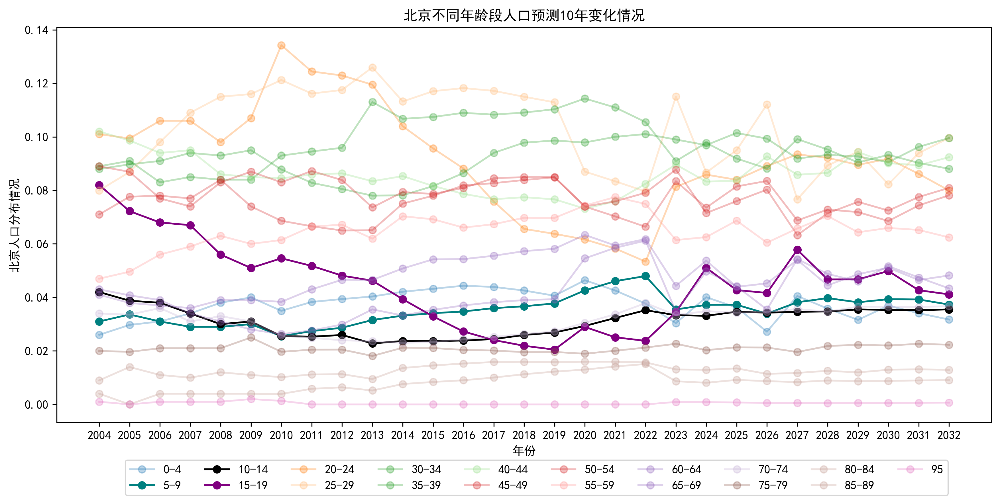

In [70]:
bj_model = VAR(bj_diff_1_df)
bj_result = bj_model.fit(5, method='ols', trend='ct')

bj_res = bj_result.forecast(bj_train_df.values, 10)

first = 2023
bj_predicted_df = pd.DataFrame(
    bj_res, columns=bj_train_df.columns, 
    index=range(first, first + len(res))
)
bj_res_df = pd.concat([bj_train_df, bj_predicted_df])
bj_index = bj_train_df.index.append(bj_predicted_df.index)
bj_res_df = pd.DataFrame(
    std4.inverse_transform(bj_res_df), 
    index=bj_index, 
    columns=bj_train_df.columns
)

tgt_cols = ['5-9', '10-14', '15-19']
tgt_color = {col: color for col, color in zip(tgt_cols, ['teal', 'black', 'purple'])}
plt.figure(figsize=(12, 6), dpi=300)
for i, (index, row) in enumerate(bj_res_df.T.iterrows()):
    x = [index for index in row.index]
    y = row.values.reshape(-1, 1)
    if index in tgt_cols:
        plt.plot(x, y, marker='o', label=index, color=tgt_color[index])
    else:
        plt.plot(x, y, marker='o', label=index, color=cmap(i / len(y)), alpha=0.3)

plt.legend(loc='lower right', bbox_to_anchor=(0.96, -0.2), ncol=10)

plt.title('北京不同年龄段人口预测10年变化情况')
plt.xlabel('年份')
plt.ylabel('北京人口分布情况')

plt.tight_layout()

plt.show()

In [71]:
bj_res_df

,0-4,5-9,10-14,15-19,20-24,25-29,30-34,35-39,40-44,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,95
2004,0.026000,0.031000,0.042000,0.082000,0.101000,0.080000,0.089000,0.088000,0.102000,0.089000,0.071000,0.047000,0.041000,0.043000,0.034000,0.020000,0.009000,0.004000,0.001000
2005,0.029714,0.033615,0.038752,0.072237,0.099415,0.086866,0.091027,0.089727,0.098635,0.086931,0.077633,0.049610,0.037906,0.040767,0.033550,0.019636,0.013979,0.000000,0.000000
2006,0.031000,0.031000,0.038000,0.068000,0.106000,0.098000,0.083000,0.091000,0.094000,0.077000,0.078000,0.056000,0.037000,0.039000,0.036000,0.021000,0.011000,0.004000,0.001000
2007,0.034000,0.029000,0.034000,0.067000,0.106000,0.109000,0.085000,0.094000,0.095000,0.074000,0.077000,0.059000,0.036000,0.034000,0.031000,0.021000,0.010000,0.004000,0.001000
2008,0.038000,0.029000,0.030000,0.056000,0.098000,0.115000,0.084000,0.093000,0.086000,0.083000,0.084000,0.063000,0.039000,0.031000,0.033000,0.021000,0.012000,0.004000,0.001000
2009,0.040000,0.030000,0.031000,0.051000,0.107000,0.116000,0.084000,0.095000,0.085000,0.087000,0.074000,0.060000,0.039000,0.028000,0.031000,0.025000,0.011000,0.004000,0.002000
2010,0.034979,0.025495,0.025546,0.054609,0.134255,0.121252,0.093004,0.087803,0.084489,0.083010,0.068631,0.061442,0.038344,0.026259,0.025750,0.019682,0.010198,0.003926,0.001326
2011,0.038294,0.027395,0.025315,0.051769,0.124443,0.116170,0.094521,0.082830,0.085951,0.087239,0.066581,0.066482,0.043000,0.027643,0.024869,0.020460,0.011196,0.005846,0.000000
2012,0.039385,0.028657,0.025951,0.048132,0.122940,0.117528,0.095926,0.080510,0.086358,0.083845,0.064998,0.067172,0.046586,0.029865,0.023969,0.020490,0.011308,0.006379,0.000000
2013,0.040335,0.031540,0.022792,0.046246,0.119491,0.125969,0.113013,0.078022,0.083412,0.073624,0.065113,0.061944,0.046529,0.035512,0.023643,0.018110,0.009504,0.005201,0.000000


In [72]:
bj_using_df = res_df[['0-4'] + tgt_cols + ['20-24']]
color = ['slategray', 'teal', 'black', 'purple', 'coral']
bj_using_df['prob_sum'] = bj_using_df.apply(lambda x: sum(x[1:4]), axis=1)
bj_using_df['pop_total'] = bj_pop_list
bj_using_df['pop_cnt'] = bj_using_df.apply(lambda x: x[-1] * x[-2], axis=1)
bj_using_df

,0-4,5-9,10-14,15-19,20-24,prob_sum,pop_total,pop_cnt
2004,0.049378,0.060828,0.082814,0.087193,0.063527,0.230835,1493.000000,344.636346
2005,0.053404,0.062444,0.079670,0.084982,0.061035,0.227097,1538.000000,349.274688
2006,0.050774,0.059185,0.074737,0.088057,0.063857,0.221979,1601.000000,355.388639
2007,0.050470,0.057373,0.070897,0.083211,0.066121,0.211481,1676.000000,354.442561
2008,0.051258,0.054646,0.067269,0.078715,0.068633,0.200630,1771.000000,355.316229
2009,0.051638,0.054078,0.062970,0.071688,0.075226,0.188736,1860.000000,351.049283
2010,0.052229,0.055883,0.065473,0.075410,0.074580,0.196767,1962.000000,386.056196
2011,0.056610,0.053509,0.054559,0.070195,0.094801,0.178263,2024.000000,360.803619
2012,0.056889,0.054513,0.053212,0.065721,0.090465,0.173446,2078.000000,360.420877
2013,0.056767,0.055833,0.051467,0.061439,0.087091,0.168739,2125.000000,358.569870


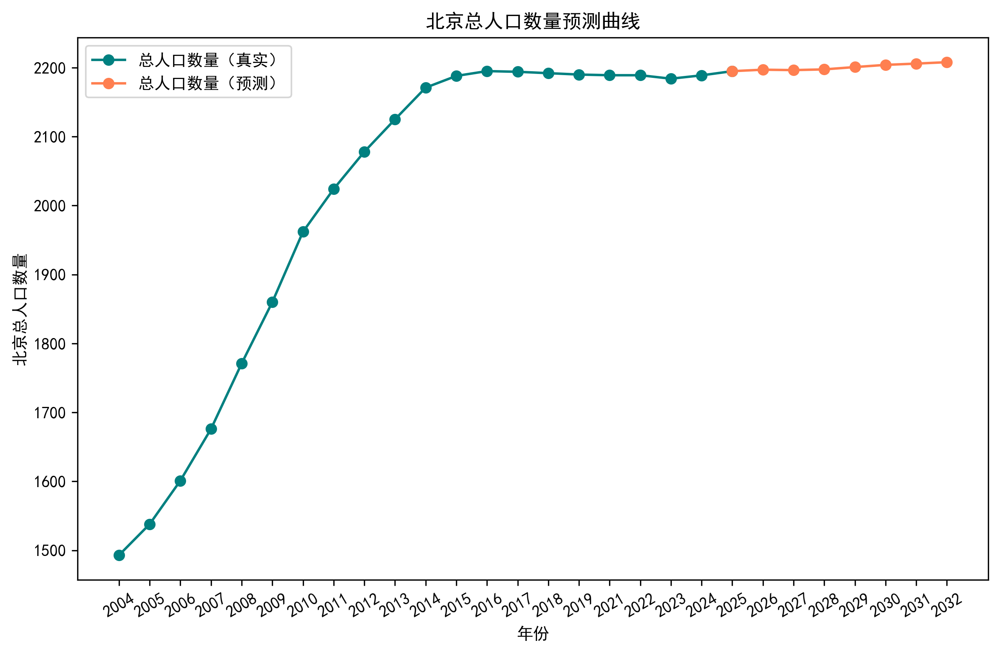

In [73]:
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(bj_pop_df.index[:21].astype(str), bj_pop_df[:21], marker='o', color='teal', label='总人口数量（真实）')
plt.plot(bj_pop_df.index[20:].astype(str), bj_pop_df[20:], marker='o', color='coral', label='总人口数量（预测）')
plt.ylabel('北京总人口数量')
plt.xlabel('年份')
plt.title('北京总人口数量预测曲线')
plt.xticks(rotation=30)
plt.legend()
plt.show()

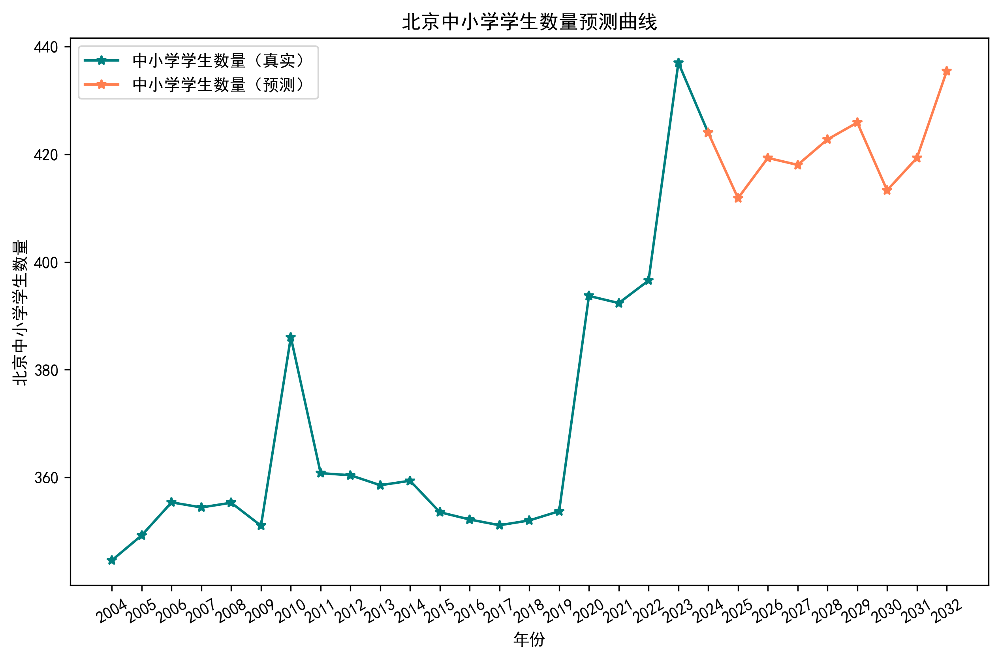

In [74]:
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(bj_using_df.index[:21].astype(str), bj_using_df.iloc[:21, -1], marker='*', color='teal', label='中小学学生数量（真实）')
plt.plot(bj_using_df.index[20:].astype(str), bj_using_df.iloc[20:, -1], marker='*', color='coral', label='中小学学生数量（预测）')
plt.ylabel('北京中小学学生数量')
plt.xlabel('年份')
plt.title('北京中小学学生数量预测曲线')
plt.xticks(rotation=30)
plt.legend()
plt.show()